In [1]:
import pandas as pd
import numpy as np
import datetime, re
from datetime import datetime, time, date
import matplotlib as mpl
from matplotlib.colors import ListedColormap
import plotly.express as px
import math
import matplotlib.pyplot as plt

## Call Data
Dataframe with calls imported from First Due

In [2]:
# calls from the previous six months
path = "~/Downloads/Programming/Response_Overview/PastYearIncidents.csv"

In [3]:
df = pd.read_csv(path)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8416 entries, 0 to 8415
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   XREF ID          8411 non-null   float64
 1   DISPATCH UNITS   6564 non-null   object 
 2   LOCATION         1694 non-null   object 
 3   TYPE             8416 non-null   object 
 4   INITIAL ADDRESS  8416 non-null   object 
 5   INITIAL CITY     8416 non-null   object 
 6   FULL MESSAGE     8287 non-null   object 
 7   MESSAGE          8292 non-null   object 
 8   CREATE DATE      8416 non-null   object 
dtypes: float64(1), object(8)
memory usage: 591.9+ KB


In [4]:
df[df.TYPE.str.contains('MUTUAL AID')]

,XREF ID,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,FULL MESSAGE,MESSAGE,CREATE DATE
40,2.400002e+09,NaN,NaN,FIRE - MUTUAL AID OUT OF CITY,40 POSSUM DR,NEW FAIRFIELD,NaN,NaN,2024-03-23 20:19
1020,2.400001e+09,NaN,NaN,FIRE - MUTUAL AID OUT OF CITY,36 SOUTH ST,BETHEL,Call Type Changed/Escalated from FCOVER to FMA...,Call Type Changed/Escalated from FCOVER to FMA...,2024-02-10 17:46
1064,2.400001e+09,NaN,NaN,FIRE - MUTUAL AID OUT OF CITY,21 W CHARCOAL RIDGE RD,NEW FAIRFIELD,T1 CANCEL PER NEW FAIRFIELD\r\n\r\nCALLED IN B...,T1 CANCEL PER NEW FAIRFIELD\r\n\r\nCALLED IN B...,2024-02-09 08:23
2630,2.300011e+09,SQ6,NaN,FIRE - MUTUAL AID OUT OF CITY,208 GREENWOOD AVE,BETHEL,"FIRE HAS BEEN KNOCKED DOWN, DANBURY COMPANIES ...","FIRE HAS BEEN KNOCKED DOWN, DANBURY COMPANIES ...",2023-12-10 10:41
3457,2.300010e+09,C30,NaN,FIRE - MUTUAL AID OUT OF CITY,54 GILLOTTI RD,NEW FAIRFIELD,NO NEED FOR VENTING \r\nALL UNITS IN SERVICE\r...,NO NEED FOR VENTING \r\nALL UNITS IN SERVICE\r...,2023-11-06 05:54
3604,2.300009e+09,E24,NaN,FIRE - MUTUAL AID OUT OF CITY,Baldwin Hill RD/Ironworks Hill RD,Brookfield,NaN,NaN,2023-10-30 14:21
3605,2.300009e+09,C30,NaN,FIRE - MUTUAL AID OUT OF CITY,9 EVAS DR,BROOKFIELD,E24 WILL BE IN SERVICE 5-10 MIN\r\n\r\nUNITS C...,E24 WILL BE IN SERVICE 5-10 MIN\r\n\r\nUNITS C...,2023-10-30 13:45
5000,2.300008e+09,"C30, E24, T1","246 FEDERAL RD, BROOKFIELD, CT, 06804",FIRE - MUTUAL AID OUT OF CITY,246 FEDERAL RD,BROOKFIELD,"CANCEL RESPONSE PER BROOKFIELD, THEY CAN HANDL...","CANCEL RESPONSE PER BROOKFIELD, THEY CAN HANDL...",2023-09-06 19:29
5330,2.300007e+09,C61,NaN,FIRE - MUTUAL AID OUT OF CITY,49 OWN HOME AVE,WILTON,CAR 61 ASSISTED WILTON PD W/ FD DRONE REQUEST ...,CAR 61 ASSISTED WILTON PD W/ FD DRONE REQUEST ...,2023-08-23 19:10
5750,2.300007e+09,"C30, C61",NaN,FIRE - MUTUAL AID OUT OF CITY,4 N STAR DR,NEW FAIRFIELD,RESCUE ASSIGMENT,RESCUE ASSIGMENT,2023-08-05 20:20


#### LOCATIONS AND CALL TYPES
I would like to develop some visualizations to show amounts and locations of call types. The data would need to be cleaned up a bit, and drilled into, to get the appropriate information

In [5]:
call_types = df.TYPE.unique().tolist()
print(len(call_types))
print(call_types)

146
['CHEST PAIN DELTA', 'BREATHING PROBLEMS DELTA', 'FALLS DELTA', 'CARDIAC / RESP ARREST DELTA', 'FIRE ALARM - COMMERCIAL', 'ALLERGIES DELTA', 'WIRES DOWN- ELECTRICAL', 'DIABETIC PROBLEMS DELTA', 'FALLS BRAVO', 'FIRE-1ST ALARM', 'CONVULSIONS / SEIZURES DELTA', 'MEDICAL ALERT - WITH FD', 'UNCONSCIOUS / FAINTING DELTA', 'UNK PROBLEM / MAN DOWN DELTA', 'MVA W INJ DELTA', 'CO DETECTOR - W/ OUT SYMPTOMS', 'CHOKING DELTA', 'BLEEDING / LACERATION DELTA', 'LOCK OUT', 'FIRE - MUTUAL AID OUT OF CITY', 'UNK PROBLEM / MAN DOWN BRAVO W/ FD', 'SICK PERSON (SPECIFIC) DELTA', 'FIRE ALARM - RESIDENTIAL', 'ASSIST PD', 'STAB / GSW / VIOLENT DELTA', 'INVESTIGATION FD', 'PUBLIC SERVICE CALL- FIRE', 'HEART PROBLEM DELTA', 'ILLEGAL BURNING', 'FALLS BRAVO W/ FD', 'MEDICAL ALERT - NO FD', 'RESCUE ELEVATOR', 'FIRE- BRUSH FIRE 1', 'KNOX BOX MAINTENANCE', 'LOCK IN', 'STROKE  / TIA DELTA', 'WATER PROBLEM', 'LOCK OUT WITH LIFE HAZARD', 'ABDOMINAL PAIN DELTA', 'HAZ-MAT LEVEL 1', 'FIRE ALARM - INVESTIGATION', 'ELEC

In [6]:
df[df.TYPE=='TRAUMA (SPECIFIC) BRAVO']

,XREF ID,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,FULL MESSAGE,MESSAGE,CREATE DATE
1339,2.400001e+09,NaN,NaN,TRAUMA (SPECIFIC) BRAVO,21 PRINDLE LN,DANBURY,BLS 1 PT\r\n\r\nCall Type Changed/Escalated fr...,BLS 1 PT\r\n\r\nCall Type Changed/Escalated fr...,2024-01-28 13:41
1350,2.400001e+09,NaN,"1 INDEPENDENCE WAY, DANBURY, CT, 06810",TRAUMA (SPECIFIC) BRAVO,1 INDEPENDENCE WAY,DANBURY,First Patient Contact at 2024-01-27 20:36:55\r...,First Patient Contact at 2024-01-27 20:36:55\r...,2024-01-27 20:33
3250,2.300010e+09,TAC1,"2 FOSTER ST, DANBURY, CT, 06810",TRAUMA (SPECIFIC) BRAVO,2 FOSTER ST,DANBURY,A2 BLS\r\n\r\n3RD FLOOR IN THE BACK\r\n\r\nCal...,A2 BLS\r\n\r\n3RD FLOOR IN THE BACK\r\n\r\nCal...,2023-11-14 17:59
4090,2.300009e+09,E23,NaN,TRAUMA (SPECIFIC) BRAVO,21 HAYESTOWN AVE,DANBURY,BLS 1 PT\r\n\r\nA2 ACK\r\n\r\nSHE WILL BE IN A...,BLS 1 PT\r\n\r\nA2 ACK\r\n\r\nSHE WILL BE IN A...,2023-10-11 17:19
4230,2.300009e+09,R1,"170 MAIN ST, DANBURY, CT, 06810",TRAUMA (SPECIFIC) BRAVO,170 MAIN ST,DANBURY,SHE STATED HER HUSBAND WILL WAVE DOWN EMS \r\n...,SHE STATED HER HUSBAND WILL WAVE DOWN EMS \r\n...,2023-10-05 16:32
4522,2.300008e+09,TAC1,NaN,TRAUMA (SPECIFIC) BRAVO,17 JOES HILL RD,DANBURY,GO THROUGH PORCH DOOR\r\n\r\nCLR STS HIP POPPE...,GO THROUGH PORCH DOOR\r\n\r\nCLR STS HIP POPPE...,2023-09-25 13:11
6428,2.300006e+09,E26,"5 PRINDLE LN, DANBURY, CT, 06811",TRAUMA (SPECIFIC) BRAVO,5 PRINDLE LN,DANBURY,A3-ALS\r\n\r\nRIGHT AT THE FRONT ENTRANCE\r\n\...,A3-ALS\r\n\r\nRIGHT AT THE FRONT ENTRANCE\r\n\...,2023-07-11 14:58
6646,2.300005e+09,C30,NaN,TRAUMA (SPECIFIC) BRAVO,93 PARK AVE,DANBURY,30 YO M JUMPED OFF SECOND FLOOR BALCONY\r\nINJ...,30 YO M JUMPED OFF SECOND FLOOR BALCONY\r\nINJ...,2023-07-02 19:15
7041,2.300005e+09,TAC1,NaN,TRAUMA (SPECIFIC) BRAVO,47 SUGAR HOLLOW RD,DANBURY,Call Type Changed/Escalated from M30 to M30B\r...,Call Type Changed/Escalated from M30 to M30B\r...,2023-06-16 12:43
7340,2.300005e+09,E23,NaN,TRAUMA (SPECIFIC) BRAVO,218 WHITE ST,DANBURY,First Patient Contact at 2023-06-03 10:30:42\r...,First Patient Contact at 2023-06-03 10:30:42\r...,2023-06-03 10:23


In [7]:
df[df.TYPE.str.contains('PUMP')]

,XREF ID,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,FULL MESSAGE,MESSAGE,CREATE DATE
1764,2.400000e+09,NaN,"12 GRACE ST, DANBURY, CT, 06811",PUMP DETAIL,12 GRACE ST,DANBURY,Call Type Changed/Escalated from F59 to F52\r\...,Call Type Changed/Escalated from F59 to F52\r\...,2024-01-10 16:31
1775,2.400000e+09,NaN,NaN,PUMP DETAIL,14 HAWTHORNE COVE RD,DANBURY,ABOUT 3 INCHES OF WATER IN BASEMENT,ABOUT 3 INCHES OF WATER IN BASEMENT,2024-01-10 12:36
1779,2.400000e+09,NaN,"50 PLEASANT ST, DANBURY, CT, 06810",PUMP DETAIL,50 PLEASANT ST,DANBURY,6 IN OF WATER IN THE BASEMENT,6 IN OF WATER IN THE BASEMENT,2024-01-10 11:53
1781,2.400000e+09,NaN,NaN,PUMP DETAIL,8 THIRD ST,DANBURY,NaN,NaN,2024-01-10 11:20
1784,2.400000e+09,NaN,"40 MEADOWBROOK RD, DANBURY, CT, 06811",PUMP DETAIL,40 MEADOWBROOK RD,DANBURY,Call Type Changed/Escalated from F59 to F52\r\...,Call Type Changed/Escalated from F59 to F52\r\...,2024-01-10 10:31
1798,2.400000e+09,NaN,"10 ELIZABETH RD, DANBURY, CT, 06811",PUMP DETAIL,10 ELIZABETH RD,DANBURY,APPROX 4IN IN THE BASEMENT,APPROX 4IN IN THE BASEMENT,2024-01-10 06:07
2405,2.300011e+09,E24,"122 GREAT PLAIN RD, DANBURY, CT, 06811",PUMP DETAIL,122 GREAT PLAIN RD,DANBURY,FAMILY FRIEND COMING WITH SUMP PUMP\r\n\r\nAPP...,FAMILY FRIEND COMING WITH SUMP PUMP\r\n\r\nAPP...,2023-12-18 11:29
2407,2.300011e+09,E3,NaN,PUMP DETAIL,98 WEST ST,DANBURY,98 AND 102 WEST ST REQ PUMP OUT\r\n\r\n4 INCH ...,98 AND 102 WEST ST REQ PUMP OUT\r\n\r\n4 INCH ...,2023-12-18 11:05
2411,2.300011e+09,BR13,"13 SUNSET DR, DANBURY, CT, 06810",PUMP DETAIL,13 SUNSET DR,DANBURY,APPROX A FOOT OF WATER IN BASEMENT. LOST ELECT...,APPROX A FOOT OF WATER IN BASEMENT. LOST ELECT...,2023-12-18 10:47
2416,2.300011e+09,E8,"15 FILMORE AVE, DANBURY, CT, 06811",PUMP DETAIL,15 FILMORE AVE,DANBURY,NaN,NaN,2023-12-18 09:34


In [8]:
drop_EMD_index = df[df.TYPE.str.contains('- EMD')].index
df.drop(labels=drop_EMD_index)

,XREF ID,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,FULL MESSAGE,MESSAGE,CREATE DATE
0,2.400002e+09,NaN,NaN,CHEST PAIN DELTA,42 GREENLAWN DR,DANBURY,A2 BLS\r\n\r\nFirst Patient Contact at 2024-03...,A2 BLS\r\n\r\nFirst Patient Contact at 2024-03...,2024-03-26 04:25
1,2.400002e+09,NaN,NaN,BREATHING PROBLEMS DELTA,5 NABBY RD,DANBURY,A2 ALS\r\n\r\nFirst Patient Contact at 2024-03...,A2 ALS\r\n\r\nFirst Patient Contact at 2024-03...,2024-03-25 23:46
2,2.400002e+09,NaN,NaN,FALLS DELTA,37 APPLE RIDGE RD,DANBURY,"A2 ALS, E26 PROVIDING DRIVER\r\n\r\nFirst Pati...","A2 ALS, E26 PROVIDING DRIVER\r\n\r\nFirst Pati...",2024-03-25 21:52
3,2.400002e+09,NaN,"63 HOSPITAL AVE, DANBURY, CT, 06810",CARDIAC / RESP ARREST DELTA,63 HOSPITAL AVE,DANBURY,"OBVIOUS CODE 66, M2 O/S\r\n\r\nOBVIOUS CODE 66...","OBVIOUS CODE 66, M2 O/S\r\n\r\nOBVIOUS CODE 66...",2024-03-25 18:55
4,2.400002e+09,NaN,"104 MILL PLAIN RD, DANBURY, CT, 06811",FIRE ALARM - COMMERCIAL,104 MILL PLAIN RD,DANBURY,NO LOCK BOX INFO \r\n\r\nBURGER KING\r\n\r\nPR...,NO LOCK BOX INFO \r\n\r\nBURGER KING\r\n\r\nPR...,2024-03-25 18:49
...,...,...,...,...,...,...,...,...,...
8411,2.300003e+09,FPH3,NaN,FIRE ALARM SERVICE/TEST,2 NATIONAL PL,DANBURY,WILL CALL WHEN DONE,WILL CALL WHEN DONE,2023-04-25 13:41
8412,2.300003e+09,TAC1,NaN,MEDICAL ALERT,25 MEMORIAL DR,DANBURY,NO ISSUE\r\n\r\nREFERENCE 70216\r\n\r\nNO PT N...,NO ISSUE\r\n\r\nREFERENCE 70216\r\n\r\nNO PT N...,2023-04-25 13:39
8413,2.300003e+09,FPH2,NaN,FIRE ALARM SERVICE/TEST,107 OSBORNE ST,DANBURY,RAPID RESPONSE TEST,RAPID RESPONSE TEST,2023-04-25 13:35
8414,2.300003e+09,E24,NaN,FIRE ALARM - RESIDENTIAL,28 CORN TASSLE RD,DANBURY,HOMEOWNER SAID ISSUE WITH THE ALARM. BEEN HAPP...,HOMEOWNER SAID ISSUE WITH THE ALARM. BEEN HAPP...,2023-04-25 13:14


#### Getting Rid of Call Types
There are several call types that are irrelevant. These call types are either a mistake, no-response call types, or unnecessary call types. Also eliminating 'COVER ASSIGNMENTS' as they are either Volunteer oriented, or a company is re assigned because of other ongoing emergency calls.

In [9]:
# eliminate the following call types:
drop_EMD_index = df[df.TYPE.str.contains('- EMD')].index
df.drop(labels=drop_EMD_index,inplace=True)

df.reset_index(drop=True,inplace=True)

removed_call_type = ['ESCORT', 'ALARM BURGLARY', 'POLICE INFORMATION',\
                     'FIRE WATCH', 'COVER ASSIGNMENT', 'EMERGENCY HIRE BACK',\
                     'PROQA MEDICAL LAUNCH', 'FIRE ALARM SERVICE/TEST', 'FIRE - INFO ONLY',\
                     'FIRE ALARM DRILL', 'FIRE TEST CALL','CONFINED SPACE ENTRY']

rem_call_df = df[df.TYPE.isin(removed_call_type)]

df = df[~df.TYPE.isin(removed_call_type)].copy()

print('Number of calls minus removed calls: ',len(df)-len(rem_call_df),'\nNumber of calls in updated dataframe: ',len(df))
df.reset_index(drop=True,inplace=True)

Number of calls minus removed calls:  7837 
Number of calls in updated dataframe:  8090


In [10]:
df.drop(columns=['XREF ID','FULL MESSAGE','MESSAGE'],inplace=True)

corrected = pd.Series(df['INITIAL ADDRESS'].apply(lambda x: ' '.join(x.split())),name='INITIAL ADDRESS').tolist()
original = df['INITIAL ADDRESS'].tolist()

mapper = {x:y for x,y in zip(original,corrected)}

df['INITIAL ADDRESS'].replace(mapper,inplace=True)
df

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE
0,NaN,NaN,CHEST PAIN DELTA,42 GREENLAWN DR,DANBURY,2024-03-26 04:25
1,NaN,NaN,BREATHING PROBLEMS DELTA,5 NABBY RD,DANBURY,2024-03-25 23:46
2,NaN,NaN,FALLS DELTA,37 APPLE RIDGE RD,DANBURY,2024-03-25 21:52
3,NaN,"63 HOSPITAL AVE, DANBURY, CT, 06810",CARDIAC / RESP ARREST DELTA,63 HOSPITAL AVE,DANBURY,2024-03-25 18:55
4,NaN,"104 MILL PLAIN RD, DANBURY, CT, 06811",FIRE ALARM - COMMERCIAL,104 MILL PLAIN RD,DANBURY,2024-03-25 18:49
...,...,...,...,...,...,...
8085,TAC1,NaN,CHEST PAIN DELTA,33 TOWN HILL AVE,DANBURY,2023-04-25 13:59
8086,E26,NaN,SICK PERSON (SPECIFIC) BRAVO,33 ABBEY LN,DANBURY,2023-04-25 13:52
8087,TAC1,NaN,MEDICAL ALERT,25 MEMORIAL DR,DANBURY,2023-04-25 13:39
8088,E24,NaN,FIRE ALARM - RESIDENTIAL,28 CORN TASSLE RD,DANBURY,2023-04-25 13:14


In [11]:
freq_address = df['INITIAL ADDRESS'].value_counts()[df['INITIAL ADDRESS'].value_counts()>11]
freq_address

25 MEMORIAL DR           118
7 BACKUS AVE             106
66 WOOSTER HEIGHTS RD     82
51 MAIN ST                80
36 W WOOSTER ST           80
                        ... 
8 DELAY ST                12
25 PADANARAM RD           12
136 DEER HILL AVE         12
100 MILL PLAIN RD         12
99 FEDERAL RD             12
Name: INITIAL ADDRESS, Length: 83, dtype: int64

In [12]:
def graph_colors(df_graph_category,len_df_category,color='red'):
    
    red = px.colors.n_colors('rgb(165,0,0)','rgb(255,0,0)',len_df_category,colortype='rgb')
    blue = px.colors.n_colors('rgb(0,0.001,150)','rgb(0,150,150)',len_df_category,colortype='rgb')
    green = px.colors.n_colors('rgb(0,150,0)','rgb(0,125,125)',len_df_category,colortype='rgb')
    yellow = px.colors.n_colors('rgb(255,255,0)','rgb(255,125,0)',len_df_category,colortype='rgb')
    dark_blue = px.colors.n_colors('rgb(.001,.001,75)','rgb(50,50,200)',len_df_category,colortype='rgb')
    red_blue = px.colors.n_colors('rgb(255,.001,.001)','rgb(.001,.001,255)',len_df_category,colortype='rgb')
    green_blue = px.colors.n_colors('rgb(0,255,.001)','rgb(0,.001,255)',len_df_category,colortype='rgb')
    
    color_list = {'red':red,'blue':blue,'green':green,'yellow':yellow,'dark_blue':dark_blue,
                 'rd_bl':red_blue,'gr_bl':green_blue}

    mapper = {x:y for x,y in zip(df_graph_category,color_list[color])}
    return mapper

In [13]:
len(df.TYPE.unique())

120

Develop a color map to help with the visualizations. Such as assigning a color spectrum for call types on frequently visited addresses.

In [14]:
mapper = {x:y for x,y in zip(df.TYPE.unique().tolist(),px.colors.n_colors('rgb(0,255,0)',
                                                                  'rgb(255,255,.001)',
                                                                  107,
                                                                  colortype='rgb'))}                             
mapper

{'CHEST PAIN DELTA': 'rgb(0.0, 255.0, 0.0)',
 'BREATHING PROBLEMS DELTA': 'rgb(2.4056603773584904, 255.0, 9.433962264150944e-06)',
 'FALLS DELTA': 'rgb(4.811320754716981, 255.0, 1.8867924528301888e-05)',
 'CARDIAC / RESP ARREST DELTA': 'rgb(7.216981132075471, 255.0, 2.830188679245283e-05)',
 'FIRE ALARM - COMMERCIAL': 'rgb(9.622641509433961, 255.0, 3.7735849056603776e-05)',
 'ALLERGIES DELTA': 'rgb(12.028301886792452, 255.0, 4.716981132075472e-05)',
 'WIRES DOWN- ELECTRICAL': 'rgb(14.433962264150942, 255.0, 5.660377358490566e-05)',
 'DIABETIC PROBLEMS DELTA': 'rgb(16.839622641509433, 255.0, 6.60377358490566e-05)',
 'FALLS BRAVO': 'rgb(19.245283018867923, 255.0, 7.547169811320755e-05)',
 'FIRE-1ST ALARM': 'rgb(21.650943396226413, 255.0, 8.49056603773585e-05)',
 'CONVULSIONS / SEIZURES DELTA': 'rgb(24.056603773584904, 255.0, 9.433962264150944e-05)',
 'MEDICAL ALERT - WITH FD': 'rgb(26.462264150943394, 255.0, 0.00010377358490566039)',
 'UNCONSCIOUS / FAINTING DELTA': 'rgb(28.8679245283018

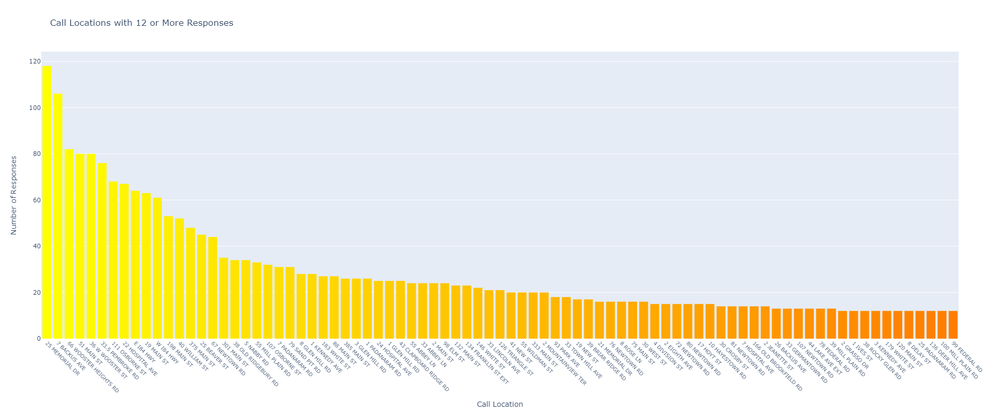

In [15]:
mapper = graph_colors(freq_address.index,len(freq_address.index),'yellow')
freq_address_bar = px.histogram(freq_address,
                                x=freq_address.index,
                                y=freq_address,
                                color=freq_address.index,
                                color_discrete_map=mapper,
                                title="Call Locations with 12 or More Responses",
                                height=800,
                                width=1600)
freq_address_bar.update_layout(yaxis_title='Number of Responses',
                               xaxis_title='Call Location',
                               showlegend=False)
freq_address_bar.update_xaxes(tickangle=45,
                             tickfont={'size':10})

In [16]:
memorial_dr = df[df['INITIAL ADDRESS'].str.contains('25 MEMORIAL DR')]
print(len(memorial_dr))

118


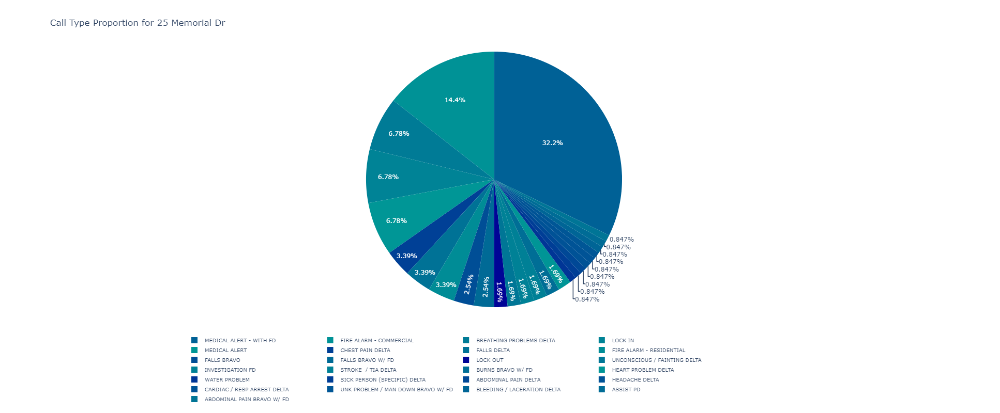

In [17]:
memorial_dr_pie = px.pie(memorial_dr,names='TYPE',
                         color='TYPE',
                         color_discrete_map=graph_colors(memorial_dr.TYPE.tolist(),len(memorial_dr.TYPE),'blue'),
                         title='Call Type Proportion for 25 Memorial Dr',
                         height=800,
                         width=800)
memorial_dr_pie.update_layout(legend_font=dict(size=10),
                             legend_orientation='h')


#### TIME
There is also a lot of data to be gleaned and used based on the time of day and time of year certain calls happen, and don't happen.

In [18]:
df['CREATE DATE'].iloc[0]

'2024-03-26 04:25'

In [19]:
df['CREATE DATE'].dtype

dtype('O')

##### Create 'DATE' & 'TIME' columns
I will create new columns to make for some simpler parsing methods and readability

In [20]:
from datetime import time,date

In [21]:
datetime.fromisoformat(df['CREATE DATE'].iloc[0])

datetime.datetime(2024, 3, 26, 4, 25)

In [22]:
time.fromisoformat(df['CREATE DATE'].iloc[0][-5:])

datetime.time(4, 25)

In [23]:
df['CREATE DATE'] = pd.to_datetime(df['CREATE DATE'])

In [24]:
df['CREATE DATE'].iloc[0]

Timestamp('2024-03-26 04:25:00')

In [25]:
print(time.isoformat(df['CREATE DATE'].iloc[0].time()))
df['CREATE DATE'].iloc[0].time()

04:25:00


datetime.time(4, 25)

In [26]:
df['TIME'] = df['CREATE DATE'].apply(lambda x: time.isoformat(x.time()))
df.TIME.head()

0    04:25:00
1    23:46:00
2    21:52:00
3    18:55:00
4    18:49:00
Name: TIME, dtype: object

In [27]:
df['DATE'] = df['CREATE DATE'].apply(lambda x: date.isoformat(x.date()))
df.DATE.head()

0    2024-03-26
1    2024-03-25
2    2024-03-25
3    2024-03-25
4    2024-03-25
Name: DATE, dtype: object

In [28]:
df[df.TIME<'07:00']

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE
0,NaN,NaN,CHEST PAIN DELTA,42 GREENLAWN DR,DANBURY,2024-03-26 04:25:00,04:25:00,2024-03-26
14,NaN,"36 W WOOSTER ST, DANBURY, CT, 06810",FIRE ALARM - COMMERCIAL,36 W WOOSTER ST,DANBURY,2024-03-25 01:51:00,01:51:00,2024-03-25
15,NaN,NaN,FIRE-1ST ALARM,286 MAIN ST,DANBURY,2024-03-25 01:41:00,01:41:00,2024-03-25
16,NaN,NaN,CHEST PAIN DELTA,5 NABBY RD,DANBURY,2024-03-25 01:17:00,01:17:00,2024-03-25
17,NaN,"10 DIXON RD, DANBURY, CT, 06811",BREATHING PROBLEMS DELTA,10 DIXON RD,DANBURY,2024-03-25 00:48:00,00:48:00,2024-03-25
...,...,...,...,...,...,...,...,...
8066,E24,NaN,CARDIAC / RESP ARREST DELTA,5 NABBY RD,DANBURY,2023-04-26 06:34:00,06:34:00,2023-04-26
8067,E26,NaN,CHEST PAIN DELTA,17 WEST CROSS TRL,DANBURY,2023-04-26 03:22:00,03:22:00,2023-04-26
8068,E23,NaN,FIRE ALARM - COMMERCIAL,183 WHITE ST,DANBURY,2023-04-26 03:09:00,03:09:00,2023-04-26
8069,SQ21,NaN,BREATHING PROBLEMS DELTA,124 SOUTH ST,DANBURY,2023-04-26 00:33:00,00:33:00,2023-04-26


In [29]:
overnight_calls = df[(df.TIME<'07:00') | (df.TIME>'21:00')].copy()

In [30]:
late_night_calls = df[(df.TIME>='00:00') | (df.TIME<'06:00')]

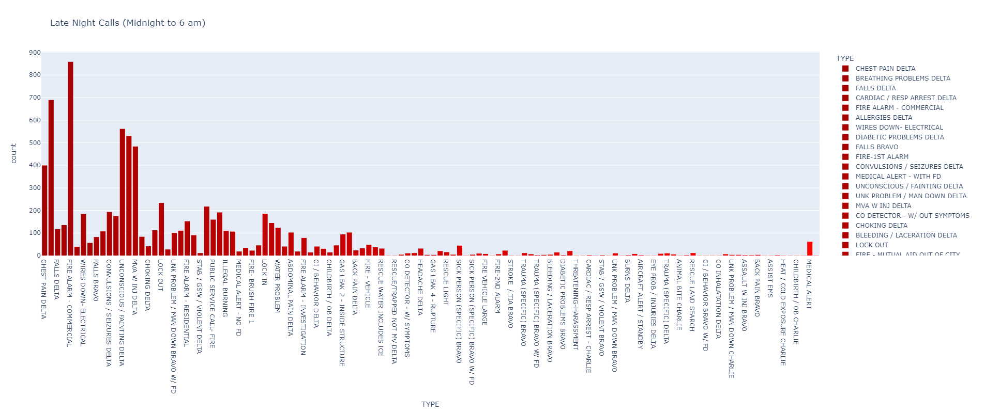

In [31]:
px.histogram(late_night_calls,
             x='TYPE',
             color='TYPE',
             color_discrete_map=graph_colors(late_night_calls.TYPE.unique().tolist(),len(late_night_calls.TYPE.unique())),
             height=800,
             width=1600,
             title = "Late Night Calls (Midnight to 6 am)")

There is definitely some merit to looking at the particular times calls happen!
#### Clean and Expound on the data a little further
I would like to clean the data a little more and be able to plot the call locations to a map. I will need latitude and longitude to be able to do so. 
For this, I can use 'geopy' and 'Nominatim' to get lat/long as an attribute associated to a particular address!

Having looked into and practiced with Nominatim, I know that some address abreviations work, and others don't. 
I know that some addresses are accepted, but some are not. Nominatim has it's limitations, but it works great as an open
source mapping module! So I may not get all the addresses imported from 'First Due' incident reporting and logging software,
but it is still going to show enough data to glean a considerable amount of information, and show trends in call types, locations,
and volume

In [32]:
len(df['INITIAL ADDRESS'][df['INITIAL ADDRESS'].str.contains('EXT')].unique())

60

In [33]:
from geopy.geocoders import Nominatim

df['INITIAL ADDRESS'].replace('TRL','TRAIL',regex=True,inplace=True)
df['INITIAL ADDRESS'].replace('LAKE AVE EXT','LAKE AVE EXTENSION',regex=True,inplace=True)

#address we need to geocode
address_list = []
address_lat_long = []

for a in range(len(df)):
    if df['INITIAL CITY'].iloc[a]!='BREWSTER':
        address_list.append(df['INITIAL ADDRESS'].iloc[a]+', '+df['INITIAL CITY'].iloc[a]+', CT')
    else:
        address_list.append(df['INITIAL ADDRESS'].iloc[a]+', '+df['INITIAL CITY'].iloc[a]+', NY')

for x in range(len(address_list)):
    address_list[x]= ' '.join(address_list[x].split())

df[df['INITIAL ADDRESS'].str.contains('EXTENSION')].head()

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE
95,NaN,NaN,MVA W INJ DELTA,12 LAKE AVE EXTENSION,DANBURY,2024-03-20 19:31:00,19:31:00,2024-03-20
144,NaN,"1 LAKE AVE EXT, DANBURY, CT, 06810",UNCONSCIOUS / FAINTING DELTA,1 LAKE AVE EXTENSION,DANBURY,2024-03-18 13:02:00,13:02:00,2024-03-18
291,NaN,NaN,BREATHING PROBLEMS DELTA,21 LAKE AVE EXTENSION,DANBURY,2024-03-13 06:11:00,06:11:00,2024-03-13
451,NaN,NaN,UNCONSCIOUS / FAINTING DELTA,47 LAKE AVE EXTENSION,DANBURY,2024-03-06 10:58:00,10:58:00,2024-03-06
489,NaN,NaN,FIRE ALARM - COMMERCIAL,2 LAKE AVE EXTENSION,DANBURY,2024-03-04 21:54:00,21:54:00,2024-03-04


Also, knowing that Nominatim uses a specific text style suing commas as separaters, I will create a new column to use it for that purpose

In [34]:
df['ADDRESS'] = address_list
print(len(df))
print(len(df.ADDRESS))

8090
8090


In [35]:
df[df.ADDRESS.isna()==True]

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE,ADDRESS


Let's take a look at how many addresses repeat within the data set. My guess is its quite a bit

In [36]:
len(df.ADDRESS.unique())

3484

Yep. More than a third of the addresses responded to are repeat addresses. In emergency services, this is as common as common gets. Addresses that are prone to higher volume can be either large shopping centers (7 Backus Ave - Danbury Fair Mall), or nursing homes, senior living facilities, or doctor's offices. Others may be prone to frequent issues such as fire alarms, like apartment buildings with hundreds of tenants at a single general address, or simply a large business that may employ a thousand people.

In [37]:
address_list = df.ADDRESS.unique().tolist()
address_list[:20]

['42 GREENLAWN DR, DANBURY, CT',
 '5 NABBY RD, DANBURY, CT',
 '37 APPLE RIDGE RD, DANBURY, CT',
 '63 HOSPITAL AVE, DANBURY, CT',
 '104 MILL PLAIN RD, DANBURY, CT',
 '27 03 CROWS NEST LN, DANBURY, CT',
 '8 PLEASANT ST, DANBURY, CT',
 '2 MAIN ST, DANBURY, CT',
 '10 HARMONY ST, DANBURY, CT',
 'MIDDLE RIVER RD/BOYCE RD, DANBURY, CT',
 '98 ELM ST, DANBURY, CT',
 '3 E LAKE RD, DANBURY, CT',
 '119 FRANKLIN ST EXT, DANBURY, CT',
 '9 S WELL AVE, DANBURY, CT',
 '36 W WOOSTER ST, DANBURY, CT',
 '286 MAIN ST, DANBURY, CT',
 '10 DIXON RD, DANBURY, CT',
 '126 TRIANGLE ST, DANBURY, CT',
 '11 PARK AVE, DANBURY, CT',
 '3 TARRYWILE LAKE RD, DANBURY, CT']

'df2' is created from old lines of code where I used Nominatim in geocoder to produce Lat's and Long's for each address. Its a laborious process forNominatim to go through <i>THOUSANDS</i> of addresses (literaly takes hours). 
So since this is an updated version, I'm going to simply take the Lat/Long's I already got from the previous geocoding and match them to the updated address lists within the new CSV. Since many of the addresses are (1) duplicates,
and (2) frequently responded too over the years, it should populate some of the new incidents (post 2023) with Lat/Long's and the old incidents with Lat/Long's that were previously generated.

In [38]:
df2 = pd.read_csv("2023_incident_dataframe.csv",index_col=0)
df2.head()

,Latitude,Longitude,Call_Location,Units,Call_Type,Call_Date_Time
0,41.400475,-73.457776,375 MAIN ST DANBURY CT,TAC1,UNK PROBLEM / MAN DOWN DELTA,2023-12-31 22:20
1,41.444630,-73.467129,12 MENDES RD DANBURY CT,E25,UNCONSCIOUS / FAINTING DELTA,2023-12-31 21:47
2,41.409278,-73.461390,9 GOLDEN HILL LN DANBURY CT,TAC1,STROKE / TIA DELTA,2023-12-31 21:44
3,41.386668,-73.454612,36 W WOOSTER ST DANBURY CT,E22,FIRE ALARM - COMMERCIAL,2023-12-31 18:15
4,41.380964,-73.437790,25 MEMORIAL DR DANBURY CT,SQ21,MEDICAL ALERT - WITH FD,2023-12-31 18:13


In [39]:
df.head()

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE,ADDRESS
0,NaN,NaN,CHEST PAIN DELTA,42 GREENLAWN DR,DANBURY,2024-03-26 04:25:00,04:25:00,2024-03-26,"42 GREENLAWN DR, DANBURY, CT"
1,NaN,NaN,BREATHING PROBLEMS DELTA,5 NABBY RD,DANBURY,2024-03-25 23:46:00,23:46:00,2024-03-25,"5 NABBY RD, DANBURY, CT"
2,NaN,NaN,FALLS DELTA,37 APPLE RIDGE RD,DANBURY,2024-03-25 21:52:00,21:52:00,2024-03-25,"37 APPLE RIDGE RD, DANBURY, CT"
3,NaN,"63 HOSPITAL AVE, DANBURY, CT, 06810",CARDIAC / RESP ARREST DELTA,63 HOSPITAL AVE,DANBURY,2024-03-25 18:55:00,18:55:00,2024-03-25,"63 HOSPITAL AVE, DANBURY, CT"
4,NaN,"104 MILL PLAIN RD, DANBURY, CT, 06811",FIRE ALARM - COMMERCIAL,104 MILL PLAIN RD,DANBURY,2024-03-25 18:49:00,18:49:00,2024-03-25,"104 MILL PLAIN RD, DANBURY, CT"


In [40]:
a = df.ADDRESS.iloc[0]
a.replace(',','')

'42 GREENLAWN DR DANBURY CT'

I'll overwrite the 'LOCATION' column with the same type of column format in df2. This will help in extracting the Latitudes and Longitudes from df2 and placing them in the new df

In [41]:
df.LOCATION = df.ADDRESS.apply(lambda x: x.replace(',',''))
df.head(10)

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE,ADDRESS
0,NaN,42 GREENLAWN DR DANBURY CT,CHEST PAIN DELTA,42 GREENLAWN DR,DANBURY,2024-03-26 04:25:00,04:25:00,2024-03-26,"42 GREENLAWN DR, DANBURY, CT"
1,NaN,5 NABBY RD DANBURY CT,BREATHING PROBLEMS DELTA,5 NABBY RD,DANBURY,2024-03-25 23:46:00,23:46:00,2024-03-25,"5 NABBY RD, DANBURY, CT"
2,NaN,37 APPLE RIDGE RD DANBURY CT,FALLS DELTA,37 APPLE RIDGE RD,DANBURY,2024-03-25 21:52:00,21:52:00,2024-03-25,"37 APPLE RIDGE RD, DANBURY, CT"
3,NaN,63 HOSPITAL AVE DANBURY CT,CARDIAC / RESP ARREST DELTA,63 HOSPITAL AVE,DANBURY,2024-03-25 18:55:00,18:55:00,2024-03-25,"63 HOSPITAL AVE, DANBURY, CT"
4,NaN,104 MILL PLAIN RD DANBURY CT,FIRE ALARM - COMMERCIAL,104 MILL PLAIN RD,DANBURY,2024-03-25 18:49:00,18:49:00,2024-03-25,"104 MILL PLAIN RD, DANBURY, CT"
5,NaN,27 03 CROWS NEST LN DANBURY CT,CHEST PAIN DELTA,27 03 CROWS NEST LN,DANBURY,2024-03-25 18:45:00,18:45:00,2024-03-25,"27 03 CROWS NEST LN, DANBURY, CT"
6,NaN,8 PLEASANT ST DANBURY CT,BREATHING PROBLEMS DELTA,8 PLEASANT ST,DANBURY,2024-03-25 17:59:00,17:59:00,2024-03-25,"8 PLEASANT ST, DANBURY, CT"
7,NaN,2 MAIN ST DANBURY CT,BREATHING PROBLEMS DELTA,2 MAIN ST,DANBURY,2024-03-25 16:22:00,16:22:00,2024-03-25,"2 MAIN ST, DANBURY, CT"
8,NaN,10 HARMONY ST DANBURY CT,ALLERGIES DELTA,10 HARMONY ST,DANBURY,2024-03-25 16:14:00,16:14:00,2024-03-25,"10 HARMONY ST, DANBURY, CT"
9,NaN,MIDDLE RIVER RD/BOYCE RD DANBURY CT,WIRES DOWN- ELECTRICAL,MIDDLE RIVER RD/BOYCE RD,DANBURY,2024-03-25 14:26:00,14:26:00,2024-03-25,"MIDDLE RIVER RD/BOYCE RD, DANBURY, CT"


In [42]:
c = 0
for x in range(len(df2)):
    if df2.iloc[x].Call_Location in df.LOCATION.to_list():
        c+=1
print(df2.iloc[x])
print(df[df.LOCATION==df2.Call_Location.iloc[x]])
print(c)

Latitude                             41.399122
Longitude                           -73.456282
Call_Location           351 MAIN ST DANBURY CT
Units                                     TAC1
Call_Type         UNK PROBLEM / MAN DOWN DELTA
Call_Date_Time                2023-04-25 12:43
Name: 5392, dtype: object
     DISPATCH UNITS                LOCATION                          TYPE  \
423             NaN  351 MAIN ST DANBURY CT            FIRE- BRUSH FIRE 1   
2632            E22  351 MAIN ST DANBURY CT               ILLEGAL BURNING   
2665            E25  351 MAIN ST DANBURY CT  UNK PROBLEM / MAN DOWN DELTA   
5593            E22  351 MAIN ST DANBURY CT              CHEST PAIN DELTA   
8089           TAC1  351 MAIN ST DANBURY CT  UNK PROBLEM / MAN DOWN DELTA   

     INITIAL ADDRESS INITIAL CITY         CREATE DATE      TIME        DATE  \
423      351 MAIN ST      DANBURY 2024-03-07 15:12:00  15:12:00  2024-03-07   
2632     351 MAIN ST      DANBURY 2023-12-09 15:02:00  15:02:00  2023-1

##### LATITUDE & LONGITUDE 
Create the Latitude and Longitude columns. I'll use np.zeros() to create an array of float's and then replace the zero's with the proper Lat/Long

In [43]:
df['LATITUDE'] = np.zeros(8090)
df['LONGITUDE'] = np.zeros(8090)
df

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
0,NaN,42 GREENLAWN DR DANBURY CT,CHEST PAIN DELTA,42 GREENLAWN DR,DANBURY,2024-03-26 04:25:00,04:25:00,2024-03-26,"42 GREENLAWN DR, DANBURY, CT",0.0,0.0
1,NaN,5 NABBY RD DANBURY CT,BREATHING PROBLEMS DELTA,5 NABBY RD,DANBURY,2024-03-25 23:46:00,23:46:00,2024-03-25,"5 NABBY RD, DANBURY, CT",0.0,0.0
2,NaN,37 APPLE RIDGE RD DANBURY CT,FALLS DELTA,37 APPLE RIDGE RD,DANBURY,2024-03-25 21:52:00,21:52:00,2024-03-25,"37 APPLE RIDGE RD, DANBURY, CT",0.0,0.0
3,NaN,63 HOSPITAL AVE DANBURY CT,CARDIAC / RESP ARREST DELTA,63 HOSPITAL AVE,DANBURY,2024-03-25 18:55:00,18:55:00,2024-03-25,"63 HOSPITAL AVE, DANBURY, CT",0.0,0.0
4,NaN,104 MILL PLAIN RD DANBURY CT,FIRE ALARM - COMMERCIAL,104 MILL PLAIN RD,DANBURY,2024-03-25 18:49:00,18:49:00,2024-03-25,"104 MILL PLAIN RD, DANBURY, CT",0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
8085,TAC1,33 TOWN HILL AVE DANBURY CT,CHEST PAIN DELTA,33 TOWN HILL AVE,DANBURY,2023-04-25 13:59:00,13:59:00,2023-04-25,"33 TOWN HILL AVE, DANBURY, CT",0.0,0.0
8086,E26,33 ABBEY LN DANBURY CT,SICK PERSON (SPECIFIC) BRAVO,33 ABBEY LN,DANBURY,2023-04-25 13:52:00,13:52:00,2023-04-25,"33 ABBEY LN, DANBURY, CT",0.0,0.0
8087,TAC1,25 MEMORIAL DR DANBURY CT,MEDICAL ALERT,25 MEMORIAL DR,DANBURY,2023-04-25 13:39:00,13:39:00,2023-04-25,"25 MEMORIAL DR, DANBURY, CT",0.0,0.0
8088,E24,28 CORN TASSLE RD DANBURY CT,FIRE ALARM - RESIDENTIAL,28 CORN TASSLE RD,DANBURY,2023-04-25 13:14:00,13:14:00,2023-04-25,"28 CORN TASSLE RD, DANBURY, CT",0.0,0.0


In [44]:
df[df.LOCATION.isin(df2.Call_Location)]

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
1,NaN,5 NABBY RD DANBURY CT,BREATHING PROBLEMS DELTA,5 NABBY RD,DANBURY,2024-03-25 23:46:00,23:46:00,2024-03-25,"5 NABBY RD, DANBURY, CT",0.0,0.0
5,NaN,27 03 CROWS NEST LN DANBURY CT,CHEST PAIN DELTA,27 03 CROWS NEST LN,DANBURY,2024-03-25 18:45:00,18:45:00,2024-03-25,"27 03 CROWS NEST LN, DANBURY, CT",0.0,0.0
6,NaN,8 PLEASANT ST DANBURY CT,BREATHING PROBLEMS DELTA,8 PLEASANT ST,DANBURY,2024-03-25 17:59:00,17:59:00,2024-03-25,"8 PLEASANT ST, DANBURY, CT",0.0,0.0
7,NaN,2 MAIN ST DANBURY CT,BREATHING PROBLEMS DELTA,2 MAIN ST,DANBURY,2024-03-25 16:22:00,16:22:00,2024-03-25,"2 MAIN ST, DANBURY, CT",0.0,0.0
8,NaN,10 HARMONY ST DANBURY CT,ALLERGIES DELTA,10 HARMONY ST,DANBURY,2024-03-25 16:14:00,16:14:00,2024-03-25,"10 HARMONY ST, DANBURY, CT",0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
8085,TAC1,33 TOWN HILL AVE DANBURY CT,CHEST PAIN DELTA,33 TOWN HILL AVE,DANBURY,2023-04-25 13:59:00,13:59:00,2023-04-25,"33 TOWN HILL AVE, DANBURY, CT",0.0,0.0
8086,E26,33 ABBEY LN DANBURY CT,SICK PERSON (SPECIFIC) BRAVO,33 ABBEY LN,DANBURY,2023-04-25 13:52:00,13:52:00,2023-04-25,"33 ABBEY LN, DANBURY, CT",0.0,0.0
8087,TAC1,25 MEMORIAL DR DANBURY CT,MEDICAL ALERT,25 MEMORIAL DR,DANBURY,2023-04-25 13:39:00,13:39:00,2023-04-25,"25 MEMORIAL DR, DANBURY, CT",0.0,0.0
8088,E24,28 CORN TASSLE RD DANBURY CT,FIRE ALARM - RESIDENTIAL,28 CORN TASSLE RD,DANBURY,2023-04-25 13:14:00,13:14:00,2023-04-25,"28 CORN TASSLE RD, DANBURY, CT",0.0,0.0


In [45]:
for x in range(len(df2)):
    df.loc[df.LOCATION==df2.Call_Location.iloc[x], 'LATITUDE'] = df2.Latitude.iloc[x]
    df.loc[df.LOCATION==df2.Call_Location.iloc[x], 'LONGITUDE'] = df2.Longitude.iloc[x]

In [46]:
df

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
0,NaN,42 GREENLAWN DR DANBURY CT,CHEST PAIN DELTA,42 GREENLAWN DR,DANBURY,2024-03-26 04:25:00,04:25:00,2024-03-26,"42 GREENLAWN DR, DANBURY, CT",0.000000,0.000000
1,NaN,5 NABBY RD DANBURY CT,BREATHING PROBLEMS DELTA,5 NABBY RD,DANBURY,2024-03-25 23:46:00,23:46:00,2024-03-25,"5 NABBY RD, DANBURY, CT",41.439642,-73.415147
2,NaN,37 APPLE RIDGE RD DANBURY CT,FALLS DELTA,37 APPLE RIDGE RD,DANBURY,2024-03-25 21:52:00,21:52:00,2024-03-25,"37 APPLE RIDGE RD, DANBURY, CT",0.000000,0.000000
3,NaN,63 HOSPITAL AVE DANBURY CT,CARDIAC / RESP ARREST DELTA,63 HOSPITAL AVE,DANBURY,2024-03-25 18:55:00,18:55:00,2024-03-25,"63 HOSPITAL AVE, DANBURY, CT",0.000000,0.000000
4,NaN,104 MILL PLAIN RD DANBURY CT,FIRE ALARM - COMMERCIAL,104 MILL PLAIN RD,DANBURY,2024-03-25 18:49:00,18:49:00,2024-03-25,"104 MILL PLAIN RD, DANBURY, CT",0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
8085,TAC1,33 TOWN HILL AVE DANBURY CT,CHEST PAIN DELTA,33 TOWN HILL AVE,DANBURY,2023-04-25 13:59:00,13:59:00,2023-04-25,"33 TOWN HILL AVE, DANBURY, CT",41.389706,-73.443571
8086,E26,33 ABBEY LN DANBURY CT,SICK PERSON (SPECIFIC) BRAVO,33 ABBEY LN,DANBURY,2023-04-25 13:52:00,13:52:00,2023-04-25,"33 ABBEY LN, DANBURY, CT",41.382131,-73.525821
8087,TAC1,25 MEMORIAL DR DANBURY CT,MEDICAL ALERT,25 MEMORIAL DR,DANBURY,2023-04-25 13:39:00,13:39:00,2023-04-25,"25 MEMORIAL DR, DANBURY, CT",41.380964,-73.437790
8088,E24,28 CORN TASSLE RD DANBURY CT,FIRE ALARM - RESIDENTIAL,28 CORN TASSLE RD,DANBURY,2023-04-25 13:14:00,13:14:00,2023-04-25,"28 CORN TASSLE RD, DANBURY, CT",41.432998,-73.434101


In [47]:
print(len(df[df.LATITUDE==0.]))
print(len(df)-len(df[df.LATITUDE==0.]))
print(len(df[df.LATITUDE!=0.]))

1462
6628
6628


#### New Latitudes and Longitudes
Now I'll need to get the Lat's and Long's I don't have for any new addresses in the database. I can continue to update this process by doing as I did before. As I get more and more incidents, the number of new addresses will increase, and also, some will likely repeat. So the process will, hopefully, take less and less time. Here, I only need to get 1462 new addresses. It's still a lot, but it is still a lot less than 5093!

In [48]:
# remember, Nominatim needs coma separaters for the addresses, so use the appropriate column
nom_addresses = df.ADDRESS[df.LATITUDE==0.].to_list()
print(len(nom_addresses))


1462


In [49]:
nom_unique_addr = df.ADDRESS[df.LATITUDE==0.].unique().tolist()

In [50]:
print(len(df.ADDRESS[df.LATITUDE==0.].unique()))
print(nom_unique_addr[:10])

955
['42 GREENLAWN DR, DANBURY, CT', '37 APPLE RIDGE RD, DANBURY, CT', '63 HOSPITAL AVE, DANBURY, CT', '104 MILL PLAIN RD, DANBURY, CT', 'MIDDLE RIVER RD/BOYCE RD, DANBURY, CT', '3 E LAKE RD, DANBURY, CT', '119 FRANKLIN ST EXT, DANBURY, CT', '10 DIXON RD, DANBURY, CT', '11 PARK AVE, DANBURY, CT', '3 TARRYWILE LAKE RD, DANBURY, CT']


In [51]:
nom_unique_addr[4][0].isdigit()

False

In [52]:
print(len(df.LOCATION[df.LATITUDE==0.]))
print(len(nom_unique_addr))

1462
955


In [53]:
#new_df = pd.DataFrame({'Address':address,'Lat':latitude,'Long':longitude})
#new_df.to_csv("new_df_add_lat_long.csv")

df1 = pd.read_csv("new_df_add_lat_long.csv")
df1.head()

,Unnamed: 0,Address,Lat,Long
0,0,"42 GREENLAWN DR, DANBURY, CT",41.389216,-73.508559
1,1,"37 APPLE RIDGE RD, DANBURY, CT",41.375880,-73.493646
2,2,"63 HOSPITAL AVE, DANBURY, CT",41.407944,-73.441769
3,3,"104 MILL PLAIN RD, DANBURY, CT",41.393277,-73.517441
4,4,"3 E LAKE RD, DANBURY, CT",41.438661,-73.499045


In [54]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522 entries, 0 to 521
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  522 non-null    int64  
 1   Address     522 non-null    object 
 2   Lat         522 non-null    float64
 3   Long        522 non-null    float64
dtypes: float64(2), int64(1), object(1)
memory usage: 16.4+ KB


Quite the difference between the number of new unique addresses and the number of addresses that Nominatim was able to get an associated Lat/Long. Some are due to Nominatim's limited ability address database, and some is due to it's due to bad data (improper address, intersections, etc). 

In [55]:
print("Total unique addresses in 'df' w/out a Lat/Long: ",len(df.ADDRESS[df.LATITUDE==0.].unique()))
print("Those addresses that then received a Lat/Long: ",len(df1.Address))
print("Total Difference: ",len(df.ADDRESS[df.LATITUDE==0.].unique())-len(df1.Address))

Total unique addresses in 'df' w/out a Lat/Long:  955
Those addresses that then received a Lat/Long:  522
Total Difference:  433


In [56]:
not_in_address = df1.Address[pd.Series(nom_unique_addr).isin(df1.Address)==False].index.tolist()

Now we can add the Latitudes and Longitudes to the original dataframe to help fill in more of those holes. We can use the same code from above...

In [57]:
for x in range(len(df1)):
    df.loc[df.ADDRESS==df1.Address.iloc[x], 'LATITUDE'] = df1.Lat.iloc[x]
    df.loc[df.ADDRESS==df1.Address.iloc[x], 'LONGITUDE'] = df1.Long.iloc[x]

In [58]:
df[df.ADDRESS.isin(df1.Address)==True]

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
0,NaN,42 GREENLAWN DR DANBURY CT,CHEST PAIN DELTA,42 GREENLAWN DR,DANBURY,2024-03-26 04:25:00,04:25:00,2024-03-26,"42 GREENLAWN DR, DANBURY, CT",41.389216,-73.508559
2,NaN,37 APPLE RIDGE RD DANBURY CT,FALLS DELTA,37 APPLE RIDGE RD,DANBURY,2024-03-25 21:52:00,21:52:00,2024-03-25,"37 APPLE RIDGE RD, DANBURY, CT",41.375880,-73.493646
3,NaN,63 HOSPITAL AVE DANBURY CT,CARDIAC / RESP ARREST DELTA,63 HOSPITAL AVE,DANBURY,2024-03-25 18:55:00,18:55:00,2024-03-25,"63 HOSPITAL AVE, DANBURY, CT",41.407944,-73.441769
4,NaN,104 MILL PLAIN RD DANBURY CT,FIRE ALARM - COMMERCIAL,104 MILL PLAIN RD,DANBURY,2024-03-25 18:49:00,18:49:00,2024-03-25,"104 MILL PLAIN RD, DANBURY, CT",41.393277,-73.517441
11,NaN,3 E LAKE RD DANBURY CT,FALLS BRAVO,3 E LAKE RD,DANBURY,2024-03-25 10:45:00,10:45:00,2024-03-25,"3 E LAKE RD, DANBURY, CT",41.438661,-73.499045
...,...,...,...,...,...,...,...,...,...,...,...
2514,"C30, E23, SQ21, T1",32 TAAGAN POINT DR DANBURY CT,GAS LEAK 2 - INSIDE STRUCTURE,32 TAAGAN POINT DR,DANBURY,2023-12-14 12:44:00,12:44:00,2023-12-14,"32 TAAGAN POINT DR, DANBURY, CT",41.434135,-73.451174
2584,E22,36 JEFFERSON AVE DANBURY CT,MEDICAL ALERT - NO FD,36 JEFFERSON AVE,DANBURY,2023-12-11 15:20:00,15:20:00,2023-12-11,"36 JEFFERSON AVE, DANBURY, CT",41.382256,-73.457758
3230,E23,4 TAAGAN POINT RD DANBURY CT,STROKE / TIA DELTA,4 TAAGAN POINT RD,DANBURY,2023-11-14 16:48:00,16:48:00,2023-11-14,"4 TAAGAN POINT RD, DANBURY, CT",41.431999,-73.443704
5653,E23,4 TAAGAN POINT RD DANBURY CT,BREATHING PROBLEMS DELTA,4 TAAGAN POINT RD,DANBURY,2023-08-04 21:39:00,21:39:00,2023-08-04,"4 TAAGAN POINT RD, DANBURY, CT",41.431999,-73.443704


In [59]:
df[df.LATITUDE==0.].head(20)

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
9,NaN,MIDDLE RIVER RD/BOYCE RD DANBURY CT,WIRES DOWN- ELECTRICAL,MIDDLE RIVER RD/BOYCE RD,DANBURY,2024-03-25 14:26:00,14:26:00,2024-03-25,"MIDDLE RIVER RD/BOYCE RD, DANBURY, CT",0.0,0.0
12,NaN,119 FRANKLIN ST EXT DANBURY CT,FIRE ALARM - COMMERCIAL,119 FRANKLIN ST EXT,DANBURY,2024-03-25 10:34:00,10:34:00,2024-03-25,"119 FRANKLIN ST EXT, DANBURY, CT",0.0,0.0
28,NaN,GREAT PLAIN RD/STADLEY ROUGH RD DANBURY CT,MVA W INJ DELTA,GREAT PLAIN RD/STADLEY ROUGH RD,DANBURY,2024-03-24 11:18:00,11:18:00,2024-03-24,"GREAT PLAIN RD/STADLEY ROUGH RD, DANBURY, CT",0.0,0.0
41,NaN,CASPER ST/TAYLOR ST DANBURY CT,WIRES DOWN- ELECTRICAL,CASPER ST/TAYLOR ST,DANBURY,2024-03-23 19:56:00,19:56:00,2024-03-23,"CASPER ST/TAYLOR ST, DANBURY, CT",0.0,0.0
44,NaN,4 GRASSO DR DANBURY CT,FIRE ALARM - COMMERCIAL,4 GRASSO DR,DANBURY,2024-03-23 16:57:00,16:57:00,2024-03-23,"4 GRASSO DR, DANBURY, CT",0.0,0.0
48,NaN,W I84 HWY DANBURY CT,MVA W INJ DELTA,W I84 HWY,DANBURY,2024-03-23 10:22:00,10:22:00,2024-03-23,"W I84 HWY, DANBURY, CT",0.0,0.0
49,NaN,82 LAKE BREEZE DR DANBURY CT,BREATHING PROBLEMS DELTA,82 LAKE BREEZE DR,DANBURY,2024-03-23 10:04:00,10:04:00,2024-03-23,"82 LAKE BREEZE DR, DANBURY, CT",0.0,0.0
55,NaN,SUGAR HOLLOW RD/BENNETTS FARM RD DANBURY CT,INVESTIGATION FD,SUGAR HOLLOW RD/BENNETTS FARM RD,DANBURY,2024-03-23 00:31:00,00:31:00,2024-03-23,"SUGAR HOLLOW RD/BENNETTS FARM RD, DANBURY, CT",0.0,0.0
59,NaN,16 TAMANNY TRAIL DANBURY CT,HEART PROBLEM DELTA,16 TAMANNY TRAIL,DANBURY,2024-03-22 15:56:00,15:56:00,2024-03-22,"16 TAMANNY TRAIL, DANBURY, CT",0.0,0.0
61,NaN,W I84 HWY DANBURY CT,MVA W INJ DELTA,W I84 HWY,DANBURY,2024-03-22 12:44:00,12:44:00,2024-03-22,"W I84 HWY, DANBURY, CT",0.0,0.0


##### Check Duplicated Data
Although there are repeat addresses and locations, let us check to make sure they are not duplicated calls..

In [60]:
df[df['CREATE DATE'].duplicated(keep=False)]

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
39,NaN,93 PARK AVE DANBURY CT,UNCONSCIOUS / FAINTING DELTA,93 PARK AVE,DANBURY,2024-03-23 20:19:00,20:19:00,2024-03-23,"93 PARK AVE, DANBURY, CT",41.384766,-73.463407
40,NaN,40 POSSUM DR NEW FAIRFIELD CT,FIRE - MUTUAL AID OUT OF CITY,40 POSSUM DR,NEW FAIRFIELD,2024-03-23 20:19:00,20:19:00,2024-03-23,"40 POSSUM DR, NEW FAIRFIELD, CT",41.456988,-73.473816
336,NaN,26 BACKUS AVE DANBURY CT,FIRE ALARM - COMMERCIAL,26 BACKUS AVE,DANBURY,2024-03-11 11:31:00,11:31:00,2024-03-11,"26 BACKUS AVE, DANBURY, CT",41.373484,-73.490401
337,NaN,1 PADANARAM RD DANBURY CT,UNK PROBLEM / MAN DOWN DELTA,1 PADANARAM RD,DANBURY,2024-03-11 11:31:00,11:31:00,2024-03-11,"1 PADANARAM RD, DANBURY, CT",41.412918,-73.455649
919,NaN,2 JEANETTE ST DANBURY CT,SICK PERSON (SPECIFIC) DELTA,2 JEANETTE ST,DANBURY,2024-02-13 17:25:00,17:25:00,2024-02-13,"2 JEANETTE ST, DANBURY, CT",0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
7615,TAC1,8 ROSE LN DANBURY CT,BACK PAIN DELTA,8 ROSE LN,DANBURY,2023-05-14 09:47:00,09:47:00,2023-05-14,"8 ROSE LN, DANBURY, CT",41.418910,-73.458073
7662,E22,16 SMITH ST DANBURY CT,CHEST PAIN DELTA,16 SMITH ST,DANBURY,2023-05-12 18:35:00,18:35:00,2023-05-12,"16 SMITH ST, DANBURY, CT",41.402308,-73.461094
7663,E24,5 NABBY RD DANBURY CT,FALLS BRAVO,5 NABBY RD,DANBURY,2023-05-12 18:35:00,18:35:00,2023-05-12,"5 NABBY RD, DANBURY, CT",41.439642,-73.415147
7699,E23,2 NABBY RD DANBURY CT,STROKE / TIA DELTA,2 NABBY RD,DANBURY,2023-05-11 10:48:00,10:48:00,2023-05-11,"2 NABBY RD, DANBURY, CT",41.442036,-73.421018


In [61]:
df[(df['CREATE DATE'].duplicated(keep=False)) & (df['LOCATION'].duplicated(keep=False))]

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
39,NaN,93 PARK AVE DANBURY CT,UNCONSCIOUS / FAINTING DELTA,93 PARK AVE,DANBURY,2024-03-23 20:19:00,20:19:00,2024-03-23,"93 PARK AVE, DANBURY, CT",41.384766,-73.463407
336,NaN,26 BACKUS AVE DANBURY CT,FIRE ALARM - COMMERCIAL,26 BACKUS AVE,DANBURY,2024-03-11 11:31:00,11:31:00,2024-03-11,"26 BACKUS AVE, DANBURY, CT",41.373484,-73.490401
337,NaN,1 PADANARAM RD DANBURY CT,UNK PROBLEM / MAN DOWN DELTA,1 PADANARAM RD,DANBURY,2024-03-11 11:31:00,11:31:00,2024-03-11,"1 PADANARAM RD, DANBURY, CT",41.412918,-73.455649
919,NaN,2 JEANETTE ST DANBURY CT,SICK PERSON (SPECIFIC) DELTA,2 JEANETTE ST,DANBURY,2024-02-13 17:25:00,17:25:00,2024-02-13,"2 JEANETTE ST, DANBURY, CT",0.000000,0.000000
920,NaN,198 MAIN ST DANBURY CT,FIRE ALARM - COMMERCIAL,198 MAIN ST,DANBURY,2024-02-13 17:25:00,17:25:00,2024-02-13,"198 MAIN ST, DANBURY, CT",41.393664,-73.451296
979,NaN,55 ABBEY LN DANBURY CT,BREATHING PROBLEMS DELTA,55 ABBEY LN,DANBURY,2024-02-11 17:43:00,17:43:00,2024-02-11,"55 ABBEY LN, DANBURY, CT",41.381542,-73.527181
980,NaN,25 BEAVER ST DANBURY CT,MEDICAL ALERT - NO FD,25 BEAVER ST,DANBURY,2024-02-11 17:43:00,17:43:00,2024-02-11,"25 BEAVER ST, DANBURY, CT",41.394328,-73.461705
1043,NaN,22 SHELTER ROCK LN DANBURY CT,ELECTRICAL PROBLEM - STRUCTURE,22 SHELTER ROCK LN,DANBURY,2024-02-09 15:23:00,15:23:00,2024-02-09,"22 SHELTER ROCK LN, DANBURY, CT",41.386500,-73.422909
1044,NaN,1 IVES ST DANBURY CT,FIRE ALARM - COMMERCIAL,1 IVES ST,DANBURY,2024-02-09 15:23:00,15:23:00,2024-02-09,"1 IVES ST, DANBURY, CT",41.396139,-73.452428
1238,NaN,66 WOOSTER HEIGHTS RD DANBURY CT,CONVULSIONS / SEIZURES DELTA,66 WOOSTER HEIGHTS RD,DANBURY,2024-02-01 09:13:00,09:13:00,2024-02-01,"66 WOOSTER HEIGHTS RD, DANBURY, CT",0.000000,0.000000


There are a myriad of duplicated times, but they do not appear to align with duplicated locations (which would indicate a duplicated call)

#### Make the 'CREATE DATE' column the Index
Let us make better use of the index scheme. This will help us to parse date and time data a little more thoroughly

In [62]:
df.rename(mapper={i:cd for i,cd in zip(df.index,df['CREATE DATE'])},inplace=True)
df.drop(columns='CREATE DATE',axis=1,inplace=True)
print(df.index)
df.info()

DatetimeIndex(['2024-03-26 04:25:00', '2024-03-25 23:46:00',
               '2024-03-25 21:52:00', '2024-03-25 18:55:00',
               '2024-03-25 18:49:00', '2024-03-25 18:45:00',
               '2024-03-25 17:59:00', '2024-03-25 16:22:00',
               '2024-03-25 16:14:00', '2024-03-25 14:26:00',
               ...
               '2023-04-25 15:53:00', '2023-04-25 15:43:00',
               '2023-04-25 15:41:00', '2023-04-25 14:40:00',
               '2023-04-25 14:38:00', '2023-04-25 13:59:00',
               '2023-04-25 13:52:00', '2023-04-25 13:39:00',
               '2023-04-25 13:14:00', '2023-04-25 12:43:00'],
              dtype='datetime64[ns]', length=8090, freq=None)
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8090 entries, 2024-03-26 04:25:00 to 2023-04-25 12:43:00
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   DISPATCH UNITS   6254 non-null   object 
 1   LOCATION         8090 

In [63]:
df.head()

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
2024-03-26 04:25:00,NaN,42 GREENLAWN DR DANBURY CT,CHEST PAIN DELTA,42 GREENLAWN DR,DANBURY,04:25:00,2024-03-26,"42 GREENLAWN DR, DANBURY, CT",41.389216,-73.508559
2024-03-25 23:46:00,NaN,5 NABBY RD DANBURY CT,BREATHING PROBLEMS DELTA,5 NABBY RD,DANBURY,23:46:00,2024-03-25,"5 NABBY RD, DANBURY, CT",41.439642,-73.415147
2024-03-25 21:52:00,NaN,37 APPLE RIDGE RD DANBURY CT,FALLS DELTA,37 APPLE RIDGE RD,DANBURY,21:52:00,2024-03-25,"37 APPLE RIDGE RD, DANBURY, CT",41.375880,-73.493646
2024-03-25 18:55:00,NaN,63 HOSPITAL AVE DANBURY CT,CARDIAC / RESP ARREST DELTA,63 HOSPITAL AVE,DANBURY,18:55:00,2024-03-25,"63 HOSPITAL AVE, DANBURY, CT",41.407944,-73.441769
2024-03-25 18:49:00,NaN,104 MILL PLAIN RD DANBURY CT,FIRE ALARM - COMMERCIAL,104 MILL PLAIN RD,DANBURY,18:49:00,2024-03-25,"104 MILL PLAIN RD, DANBURY, CT",41.393277,-73.517441


#### Drop Columns and Rename
Finally, drop 'INITIAL ADDRESS' AND 'INITIAL CITY', and rename 'DISPATCH UNITS' to, simply, 'UNITS'

In [64]:
df.rename(columns={'DISPATCH UNITS':'UNITS'},inplace=True)
df.drop(columns=['INITIAL ADDRESS','INITIAL CITY'],inplace=True)
df.head()

,UNITS,LOCATION,TYPE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
2024-03-26 04:25:00,NaN,42 GREENLAWN DR DANBURY CT,CHEST PAIN DELTA,04:25:00,2024-03-26,"42 GREENLAWN DR, DANBURY, CT",41.389216,-73.508559
2024-03-25 23:46:00,NaN,5 NABBY RD DANBURY CT,BREATHING PROBLEMS DELTA,23:46:00,2024-03-25,"5 NABBY RD, DANBURY, CT",41.439642,-73.415147
2024-03-25 21:52:00,NaN,37 APPLE RIDGE RD DANBURY CT,FALLS DELTA,21:52:00,2024-03-25,"37 APPLE RIDGE RD, DANBURY, CT",41.375880,-73.493646
2024-03-25 18:55:00,NaN,63 HOSPITAL AVE DANBURY CT,CARDIAC / RESP ARREST DELTA,18:55:00,2024-03-25,"63 HOSPITAL AVE, DANBURY, CT",41.407944,-73.441769
2024-03-25 18:49:00,NaN,104 MILL PLAIN RD DANBURY CT,FIRE ALARM - COMMERCIAL,18:49:00,2024-03-25,"104 MILL PLAIN RD, DANBURY, CT",41.393277,-73.517441


#### Overall Data Set
The data set, at this point, is properly formatted, indexed, and accurate. It is now in a good place to be used to start extracting data to gain perspective on the types, volume, times, and locations of the various emergencies the DFD is handling.<br>
Using the data to create visual representations is a good method to help interpret the response trends of the Department. Heatmaps of response areas, Graphs illustrating call types and times will help showcase the responsibilities of the DFD overall, and its individual companies.

In [65]:
df.to_csv("past_year_incidents.csv")

<br> 

### Mapping

In [66]:
import folium
from folium.plugins import MarkerCluster, HeatMap

In [67]:
danbury = (41.394966,-73.454079) # center of Danbury lat/long
call_map = folium.Map(location=danbury, height=800,width=1200,zoom_start=12)
df_latlong = df[(df.LATITUDE!=0.0) & (df.LONGITUDE!=0.0)].copy() # use only the data that has an accompanying latitude and longitude

Locations = MarkerCluster().add_to(call_map)
for lg,ln,add in zip(df_latlong.LATITUDE.iloc[:100],df_latlong.LONGITUDE.iloc[:100],df_latlong.LOCATION.iloc[:100]):
    folium.Marker(location=[lg,ln], popup=add,icon=None).add_to(Locations)
call_map

Using particular markers can be overwhelming if the map is just a 'bunch of pin drops', So maybe a heatmap would be better representation. This way the more frequent an area or location is responded too, the denser the representation will be on the map. This should give a good impression of not just call volume, but areas of increased volume.

In [68]:
calls = folium.Map(location=danbury,zoom_start=12,height=800,width=1200)
data = [[lt,ln] for lt,ln in zip(df_latlong.LATITUDE,df_latlong.LONGITUDE)]
HeatMap(data,radius=10).add_to(calls)
calls

Folium looks ok, but I like the Plotly Express maps better

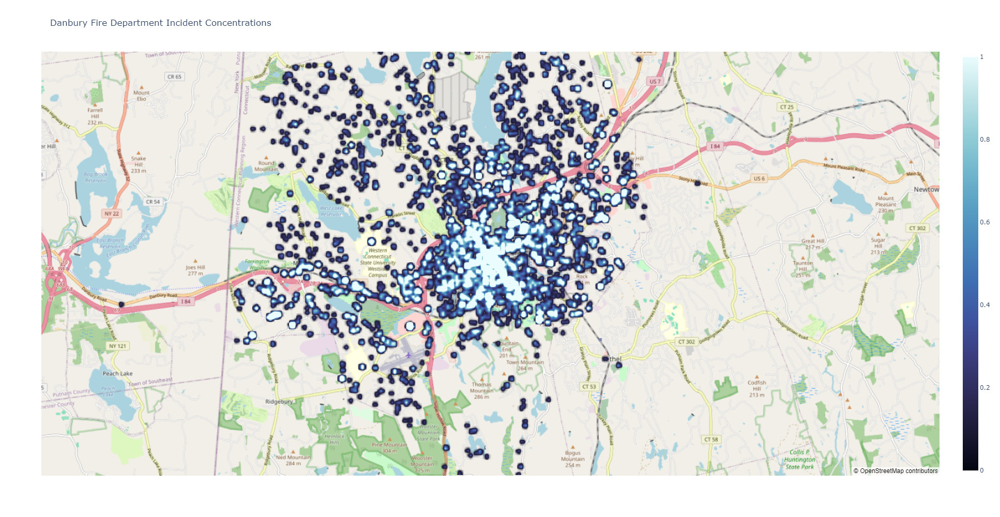

In [69]:
px.density_mapbox(data_frame=df_latlong,
                  lat='LATITUDE',
                  lon='LONGITUDE',
                  zoom=12,
                  center={'lat':danbury[0],'lon':danbury[1]},
                  mapbox_style='open-street-map',
                  color_continuous_scale=px.colors.sequential.ice,
                  radius=7,
                  title='Danbury Fire Department Incident Concentrations',
                  height=1000,
                  width=1000,
                 )

In [70]:
loc_data = df[(df.LATITUDE!=0.0) & (df.LONGITUDE!=0.) & (df.UNITS.isna()==False)].copy()
loc_data

,UNITS,LOCATION,TYPE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
2024-01-08 08:07:00,E25,116 E PEMBROKE RD DANBURY CT,MVA W INJ DELTA,08:07:00,2024-01-08,"116 E PEMBROKE RD, DANBURY, CT",41.432091,-73.470086
2024-01-08 06:46:00,TAC1,34 PATRIOT DR DANBURY CT,LOCK OUT,06:46:00,2024-01-08,"34 PATRIOT DR, DANBURY, CT",41.397487,-73.451010
2024-01-07 23:48:00,E23,136 PEMBROKE RD DANBURY CT,CO DETECTOR - W/ OUT SYMPTOMS,23:48:00,2024-01-07,"136 PEMBROKE RD, DANBURY, CT",41.444236,-73.474926
2024-01-07 23:24:00,E23,136 PEMBROKE RD DANBURY CT,LOCK IN,23:24:00,2024-01-07,"136 PEMBROKE RD, DANBURY, CT",41.444236,-73.474926
2024-01-07 23:19:00,E25,6 BULLET HILL RD DANBURY CT,FALLS BRAVO,23:19:00,2024-01-07,"6 BULLET HILL RD, DANBURY, CT",41.432462,-73.475015
...,...,...,...,...,...,...,...,...
2023-04-25 13:59:00,TAC1,33 TOWN HILL AVE DANBURY CT,CHEST PAIN DELTA,13:59:00,2023-04-25,"33 TOWN HILL AVE, DANBURY, CT",41.389706,-73.443571
2023-04-25 13:52:00,E26,33 ABBEY LN DANBURY CT,SICK PERSON (SPECIFIC) BRAVO,13:52:00,2023-04-25,"33 ABBEY LN, DANBURY, CT",41.382131,-73.525821
2023-04-25 13:39:00,TAC1,25 MEMORIAL DR DANBURY CT,MEDICAL ALERT,13:39:00,2023-04-25,"25 MEMORIAL DR, DANBURY, CT",41.380964,-73.437790
2023-04-25 13:14:00,E24,28 CORN TASSLE RD DANBURY CT,FIRE ALARM - RESIDENTIAL,13:14:00,2023-04-25,"28 CORN TASSLE RD, DANBURY, CT",41.432998,-73.434101


In [71]:
e22 = loc_data[loc_data.UNITS.str.contains('E22')].copy()

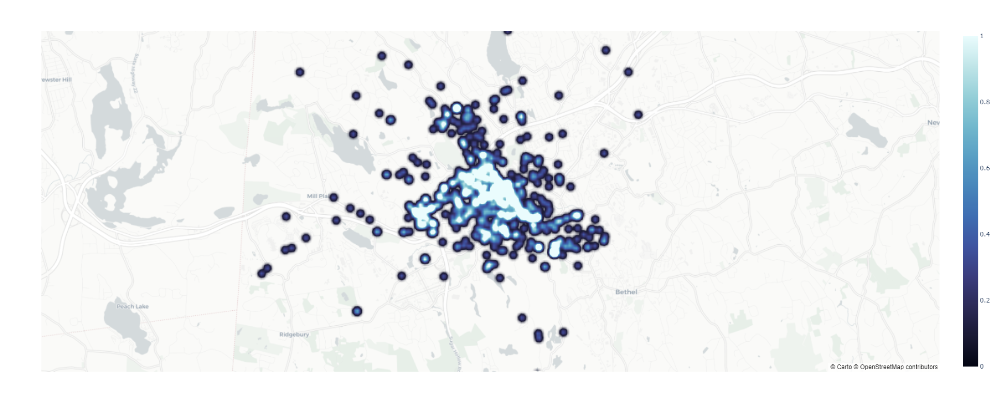

In [72]:
px.density_mapbox(data_frame=e22,
                  lat='LATITUDE',
                  lon='LONGITUDE',
                  color_continuous_scale=px.colors.sequential.ice,
                  radius=12,
                  zoom=12,
                  mapbox_style='carto-positron',
                  height=800,
                  width=1200)

Now we'll try some other visualizations for call types and time periods<br>
First I will create a color graphing function to help map colors for the graphs and their data.

In [73]:
def graph_colors(df_graph_category,len_df_category,color='red'):
    
    red = px.colors.n_colors('rgb(255,0,0)','rgb(.001,0,255)',len_df_category,colortype='rgb')
    blue = px.colors.n_colors('rgb(0,0,255)','rgb(255,0,.001)',len_df_category,colortype='rgb')
    green = px.colors.n_colors('rgb(0,255,0)','rgb(0,.001,255)',len_df_category,colortype='rgb')
    yellow = px.colors.n_colors('rgb(255,255,0)','rgb(255,.001,0)',len_df_category,colortype='rgb')
    
    color_list = {'red':red,'blue':blue,'green':green,'yellow':yellow}
    
    mapper = {x:y for x,y in zip(df_graph_category,color_list[color])}
    return mapper

We can break down the data to see just what makes up various kinds of responses and the the kinds of responses to various frequent locations.

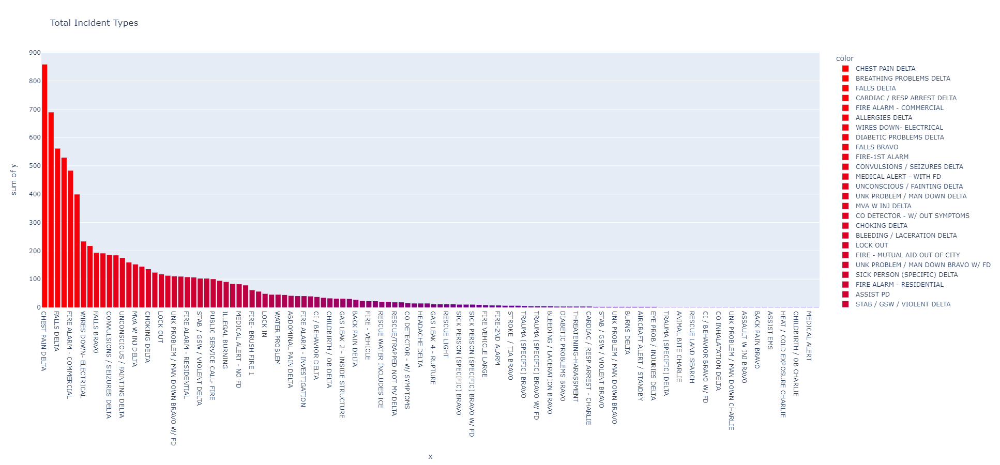

In [74]:
px.histogram(data_frame=df,
             x=df.TYPE.unique(),
             y=df.TYPE.value_counts(),
             color=df.TYPE.unique(),
             color_discrete_map=graph_colors(df.TYPE.unique(),len(df.TYPE.unique()),'red'),
             height=900,
             width=1600,
             title='Total Incident Types')

That is a lot of data and not very telling since it's dominated by a small subset of incident types.<br>
Perhanps breaking the data set down to specific companies would help produce a better picture? Or possibly break out the most frequent types of incidents, and look at the other calls in a separate visual?

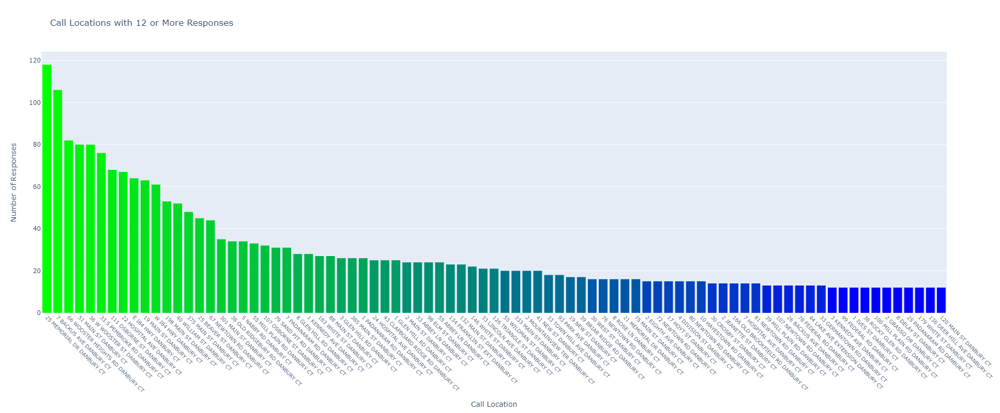

In [75]:
# Let's start with the most frequently responded too locations; and arbitrarily take a location which averages one response a month...
freq_address = df['LOCATION'].value_counts()[df['LOCATION'].value_counts()>11]

# Map out the colors
mapper = graph_colors(freq_address,len(freq_address),color='green')

#create the visual
freq_address_bar = px.histogram(freq_address,
                                x=freq_address.index,
                                y=freq_address,
                                color=freq_address,
                                color_discrete_map=mapper,
                                title="Call Locations with 12 or More Responses",
                                height=800,
                                width=1600)
freq_address_bar.update_layout(yaxis_title='Number of Responses',
                               xaxis_title='Call Location',
                               showlegend=False)
freq_address_bar.update_xaxes(tickangle=45,
                             tickfont={'size':10})

That is still a large amount of locations. We can further break it down to 'most frequent response locations per company'.

In [76]:
df.columns

Index(['UNITS', 'LOCATION', 'TYPE', 'TIME', 'DATE', 'ADDRESS', 'LATITUDE',
       'LONGITUDE'],
      dtype='object')

In [77]:
def location_response(company):
    if company=='ALL':
        dff = df.LOCATION.value_counts()[df.LOCATION.value_counts()>=20]
    else:
        company=company.upper()
        dff = df[(df.UNITS.str.contains(company)) & (df.UNITS.isna()==False)]
        dff = dff.LOCATION.value_counts()[dff.LOCATION.value_counts()>=6]
    return dff

In [78]:
location_response('ALL')

25 MEMORIAL DR DANBURY CT           118
7 BACKUS AVE DANBURY CT             106
66 WOOSTER HEIGHTS RD DANBURY CT     82
51 MAIN ST DANBURY CT                80
36 W WOOSTER ST DANBURY CT           80
33.5 PEMBROKE RD DANBURY CT          76
111 OSBORNE ST DANBURY CT            68
22 HOSPITAL AVE DANBURY CT           67
E I84 HWY DANBURY CT                 64
19 MAIN ST DANBURY CT                63
W I84 HWY DANBURY CT                 61
198 MAIN ST DANBURY CT               53
40 WILLIAM ST DANBURY CT             52
375 MAIN ST DANBURY CT               48
25 BEAVER ST DANBURY CT              45
67 NEWTOWN RD DANBURY CT             44
301 MAIN ST DANBURY CT               35
38 OLD RIDGEBURY RD DANBURY CT       34
5 NABBY RD DANBURY CT                34
55 MILL PLAIN RD DANBURY CT          33
107 OSBORNE ST DANBURY CT            32
79 SAND PIT RD DANBURY CT            31
7 PADANARAM RD DANBURY CT            31
8 GLEN HILL RD DANBURY CT            28
1 KENNEDY AVE DANBURY CT             28


In [79]:
type = df.TYPE.unique().tolist()
companies = ['C30','T1','TAC1','SQ21','E22','E23','E24','E25','E26']

# create an array of appropriate size
array = np.zeros([len(type),len(companies)],dtype=int)

#create the dataframe
units_df = pd.DataFrame(array,index=type,columns=companies)
units_df

,C30,T1,TAC1,SQ21,E22,E23,E24,E25,E26
CHEST PAIN DELTA,0,0,0,0,0,0,0,0,0
BREATHING PROBLEMS DELTA,0,0,0,0,0,0,0,0,0
FALLS DELTA,0,0,0,0,0,0,0,0,0
CARDIAC / RESP ARREST DELTA,0,0,0,0,0,0,0,0,0
FIRE ALARM - COMMERCIAL,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
HEAT / COLD EXPOSURE DELTA,0,0,0,0,0,0,0,0,0
CHILDBIRTH / OB CHARLIE,0,0,0,0,0,0,0,0,0
BACK PAIN CHARLIE,0,0,0,0,0,0,0,0,0
MEDICAL ALERT,0,0,0,0,0,0,0,0,0


In [80]:
# populate the datframe with appropriate incident totals per incident type by company
for c in companies:
    unit = df[(df.UNITS.str.contains(c)) & (df.UNITS.isna()==False)].TYPE.value_counts()
    for i in range(len(units_df)):
        if units_df.index[i] in unit.index:
            units_df[c].loc[units_df.index[i]] = unit[units_df.index[i]]
units_df

,C30,T1,TAC1,SQ21,E22,E23,E24,E25,E26
CHEST PAIN DELTA,2,1,82,32,34,37,29,31,36
BREATHING PROBLEMS DELTA,1,0,124,75,56,107,52,31,56
FALLS DELTA,0,0,14,17,13,14,10,11,10
CARDIAC / RESP ARREST DELTA,5,1,48,9,8,17,14,3,8
FIRE ALARM - COMMERCIAL,193,202,3,18,192,149,66,17,97
...,...,...,...,...,...,...,...,...,...
HEAT / COLD EXPOSURE DELTA,0,0,1,0,0,0,0,0,0
CHILDBIRTH / OB CHARLIE,0,0,0,1,0,0,0,0,0
BACK PAIN CHARLIE,0,0,0,1,0,0,0,0,0
MEDICAL ALERT,1,1,30,9,4,6,4,4,4


Now we can try to obtain a graphical representation of responses to frequently responded locations per company

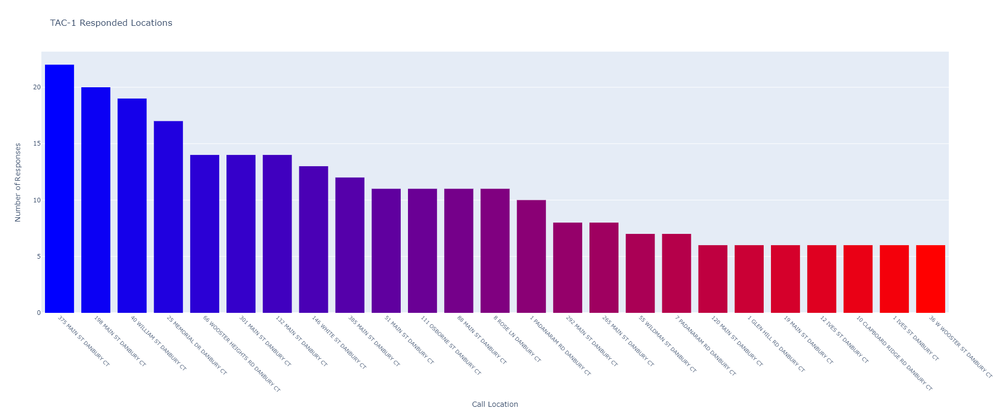

In [81]:
tac1 = location_response('tac1')
mapper = graph_colors(tac1.index,len(tac1.index),'blue')
freq_address_bar = px.histogram(tac1,
                                x=tac1.index,
                                y=tac1,
                                color=tac1.index,
                                color_discrete_map=mapper,
                                title="TAC-1 Responded Locations",
                                height=800,
                                width=1600)
freq_address_bar.update_layout(yaxis_title='Number of Responses',
                               xaxis_title='Call Location',
                               showlegend=False)
freq_address_bar.update_xaxes(tickangle=45,
                             tickfont={'size':10})

Creating a new dataframe of the total incidents per incident type for each company can also prove insightful.

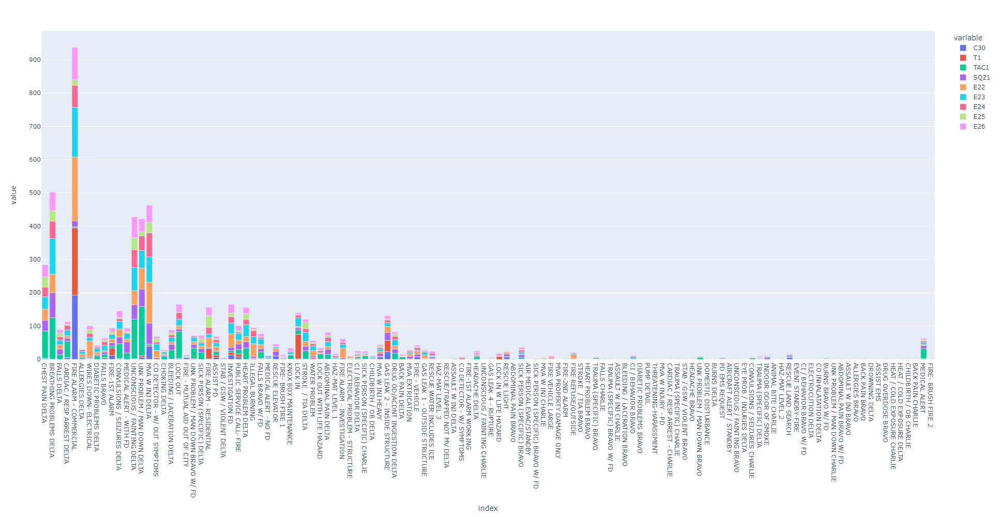

In [85]:
px.bar(data_frame=units_df,
       x=units_df.index,
       y=units_df.columns,
       height=1000,
       width=1500)

Create a function that will collect the call type data for different companies

In [86]:
def calls_by_company(company):
    if company != None:
        company = company.upper()
        calls = df[(df.UNITS.str.contains(company)) & (df.UNITS.isna()==False)].copy()
    else:
        calls = df.copy()
    bar = px.histogram(calls,
                       x='TYPE',
                       color='TYPE',
                       color_discrete_map=graph_colors(calls.TYPE.unique(),len(calls.TYPE.unique()),'yellow'),
                       title=f"{company} Incident Count by Type",
                       height=800,
                       width=1400)
    bar.update_layout(yaxis_title='Number of Incidents',
                      xaxis_title='Incident Type',
                      showlegend=False)
    bar.update_xaxes(tickangle=45,
                     tickfont=dict(size=10))
    return bar

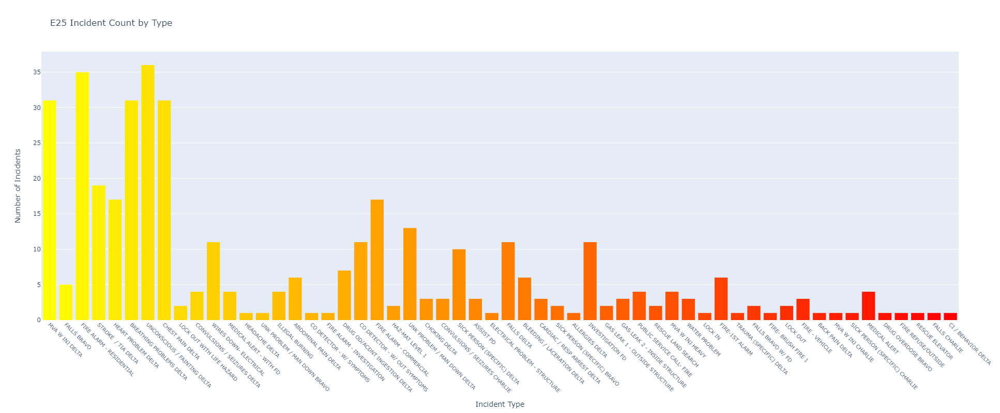

In [87]:
calls_by_company('e25')

Create a function that will show the more frequent incident types

In [88]:
units_df['E22'][units_df['E22']>5]

CHEST PAIN DELTA                       34
BREATHING PROBLEMS DELTA               56
FALLS DELTA                            13
CARDIAC / RESP ARREST DELTA             8
FIRE ALARM - COMMERCIAL               192
ALLERGIES DELTA                         9
WIRES DOWN- ELECTRICAL                 48
DIABETIC PROBLEMS DELTA                 8
FIRE-1ST ALARM                         11
CONVULSIONS / SEIZURES DELTA           24
MEDICAL ALERT - WITH FD                 9
UNCONSCIOUS / FAINTING DELTA           43
UNK PROBLEM / MAN DOWN DELTA           63
MVA W INJ DELTA                       123
CO DETECTOR - W/ OUT SYMPTOMS          21
BLEEDING / LACERATION DELTA             7
LOCK OUT                               10
UNK PROBLEM / MAN DOWN BRAVO W/ FD      8
SICK PERSON (SPECIFIC) DELTA            8
FIRE ALARM - RESIDENTIAL               30
ASSIST PD                              12
INVESTIGATION FD                       41
PUBLIC SERVICE CALL- FIRE              12
HEART PROBLEM DELTA               

In [89]:
def freq_incident(company):
    co_df = units_df[company][units_df[company]>5]
    bar = px.histogram(co_df,
                       x=co_df.index,
                       y=co_df,
                       color=co_df.index,
                       color_discrete_map=graph_colors(co_df.index,len(co_df.index),'blue'),
                       title=f"{company} Incident Types With 6 or More Responses",
                       height=800,
                       width=1400)
    bar.update_layout(yaxis_title='Number of Incidents',
                      xaxis_title='Incident Type',
                      showlegend=False)
    bar.update_xaxes(tickangle=45,
                     tickfont=dict(size=10))
    return bar

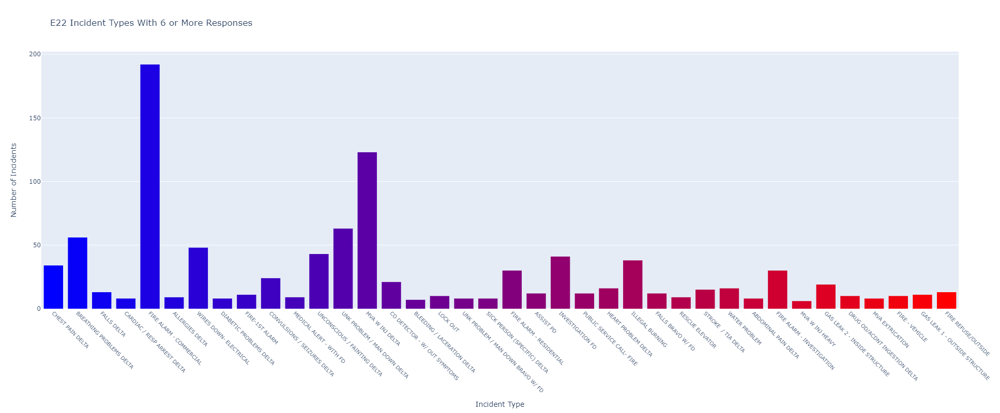

In [90]:
freq_incident('E22')

#### Create Some Functions to Help Parse Data and Expand on Data

In [91]:
def company_heatmap(company):
    company = company.upper()
    data = df[(df.UNITS.str.contains(company)) & (df.UNITS.isna()==False)]
    district = {'HQ':(41.393510,-73.455480),
                'E23':(41.407951,-73.436729),
                'E24':(41.413050,-73.422240),
                'E25':(41.427157,-73.504407),
                'E26':(41.373615,-73.487025)}
    if company not in ['E23','E24','E25','E26']:
        lat = district['HQ'][0]
        long = district['HQ'][1]
        zoom=11
        radius=7
    else:
        lat=district[company][0]
        long=district[company][1]
        zoom=12
        radius=8
        
    fig = px.density_mapbox(data,
                            lat='LATITUDE',
                            lon='LONGITUDE',
                            hover_data=['TYPE','ADDRESS'],
                            center={'lat':lat,'lon':long},
                            color_continuous_scale=px.colors.sequential.ice,
                            zoom=zoom,
                            mapbox_style='open-street-map',
                            radius=radius,
                            title= f'Danbury Fire Department Incident Concentration Heatmap for {company.upper()}',
                            height=800,
                            width=1200,
                           )

    return fig

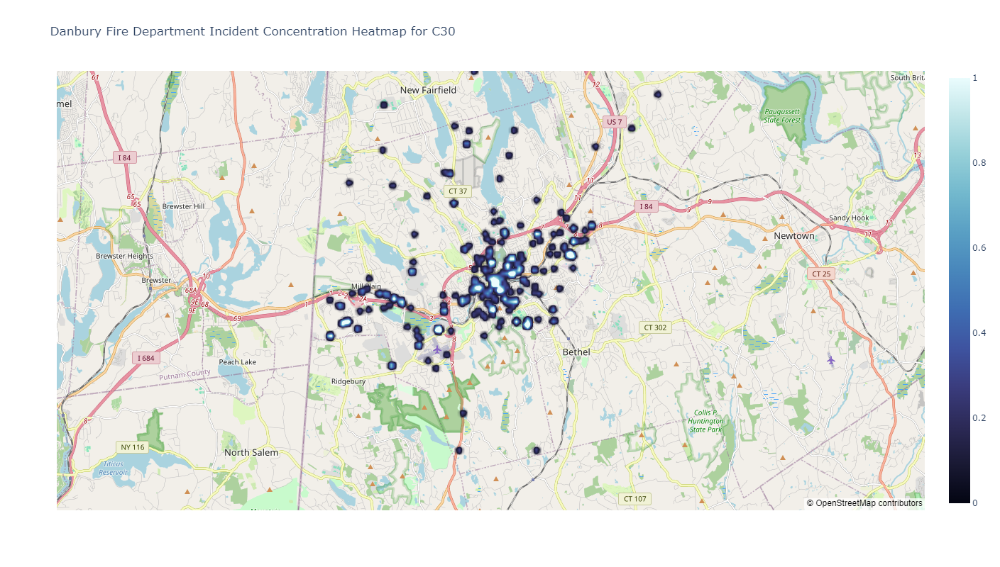

In [92]:
company_heatmap('c30')

In [93]:
times = [f'0{x}:00' if x < 10 else f'{x}:00' for x in range(24)]
hourly = [f'{times[t-1]}-{times[t]}' for t in range(1,len(times))]
hourly.append('23:00-00:00')
print("Length 'times': ",len(times),'\n'"Length 'hourly': ",len(hourly))
print(times,'\n\n',hourly)

Length 'times':  24 
Length 'hourly':  24
['00:00', '01:00', '02:00', '03:00', '04:00', '05:00', '06:00', '07:00', '08:00', '09:00', '10:00', '11:00', '12:00', '13:00', '14:00', '15:00', '16:00', '17:00', '18:00', '19:00', '20:00', '21:00', '22:00', '23:00'] 

 ['00:00-01:00', '01:00-02:00', '02:00-03:00', '03:00-04:00', '04:00-05:00', '05:00-06:00', '06:00-07:00', '07:00-08:00', '08:00-09:00', '09:00-10:00', '10:00-11:00', '11:00-12:00', '12:00-13:00', '13:00-14:00', '14:00-15:00', '15:00-16:00', '16:00-17:00', '17:00-18:00', '18:00-19:00', '19:00-20:00', '20:00-21:00', '21:00-22:00', '22:00-23:00', '23:00-00:00']


In [94]:
df.columns

Index(['UNITS', 'LOCATION', 'TYPE', 'TIME', 'DATE', 'ADDRESS', 'LATITUDE',
       'LONGITUDE'],
      dtype='object')

##### Time Comparisons
Work on time comparisons between times of day, company responses during certain hours, etc.</br>
Using 'indexer_between_time' method on the index is a very valuable tool for parsing the time data, and another reason for using the date and time of a call as the index

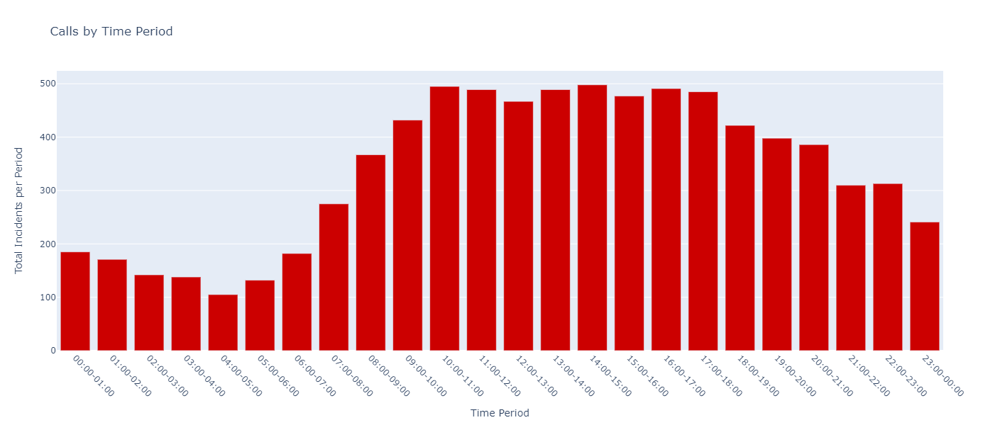

In [95]:
dff = df.copy()
# hourly time periods and ranges
daytimes = [f'0{x}:00' if x < 10 else f'{x}:00' for x in range(24)]
hourly = [f'{daytimes[t-1]}-{daytimes[t]}' for t in range(1,len(daytimes))]
hourly.append('23:00-00:00')

# Total calls per hourly period
periodtotalincidents = []
for x in range(len(daytimes)):
    if x != 23:
        total_inc = dff.iloc[dff.index.indexer_between_time(daytimes[x],daytimes[x+1],include_end=False)].TYPE.count()
        periodtotalincidents.append(total_inc)
    else:
        total_inc = dff.iloc[dff.index.indexer_between_time(daytimes[x],'00:00:00',include_end=False)].TYPE.count()
        periodtotalincidents.append(total_inc)            
periodtotalincidents = pd.Series(periodtotalincidents,index=hourly,name='Total')

timegraph = px.bar(data_frame=periodtotalincidents,
                   x=periodtotalincidents.index,
                   y=periodtotalincidents,
                   color=periodtotalincidents.index,
                   color_discrete_map={i:'#cc0000' for i in periodtotalincidents.index},
                   title='Calls by Time Period',
                   height=600,
                   width=800,)
timegraph.update_layout(xaxis_title='Time Period',
                        yaxis_title='Total Incidents per Period',
                        showlegend=False)
timegraph.update_xaxes(tickangle=45,
                       tickfont=dict(size=12))


We can break that down to time periods for individual companies and/or individual months</br>
First, make the above graph a function. Then develep a function for the company, time, and month selection

In [96]:
def time_totals(dff):
    # hourly time periods and ranges
    daytimes = [f'0{x}:00' if x < 10 else f'{x}:00' for x in range(24)]
    hourly = [f'{daytimes[t-1]}-{daytimes[t]}' for t in range(1,len(daytimes))]
    hourly.append('23:00-00:00')
    
    # Total calls per hourly period
    periodtotalincidents = []
    for x in range(len(daytimes)):
        if x != 23:
            total_inc = dff.iloc[dff.index.indexer_between_time(daytimes[x],daytimes[x+1],include_end=False)].TYPE.count()
            periodtotalincidents.append(total_inc)
        else:
            total_inc = dff.iloc[dff.index.indexer_between_time(daytimes[x],'00:00:00',include_end=False)].TYPE.count()
            periodtotalincidents.append(total_inc)            
    periodtotalincidents = pd.Series(periodtotalincidents,index=hourly,name='Total')
    
    timegraph = px.bar(data_frame=periodtotalincidents,
                       x=periodtotalincidents.index,
                       y=periodtotalincidents,
                       color=periodtotalincidents.index,
                       color_discrete_map={i:'#cc0000' for i in periodtotalincidents.index},
                       title='Calls by Time Period',
                       height=600,
                       width=800,)
    timegraph.update_layout(xaxis_title='Time Period',
                            yaxis_title='Total Incidents per Period',
                            showlegend=False)
    timegraph.update_xaxes(tickangle=45,
                           tickfont=dict(size=12))
    return timegraph

In [97]:
units = ['C30','TAC1','T1','SQ21','E22','E23','E24','E25','E26']

In [98]:
def unit_df(dff,unit):
    dff = dff[(dff['UNITS'].str.contains(unit)) & (dff['UNITS'].isna()==False)]
    return dff

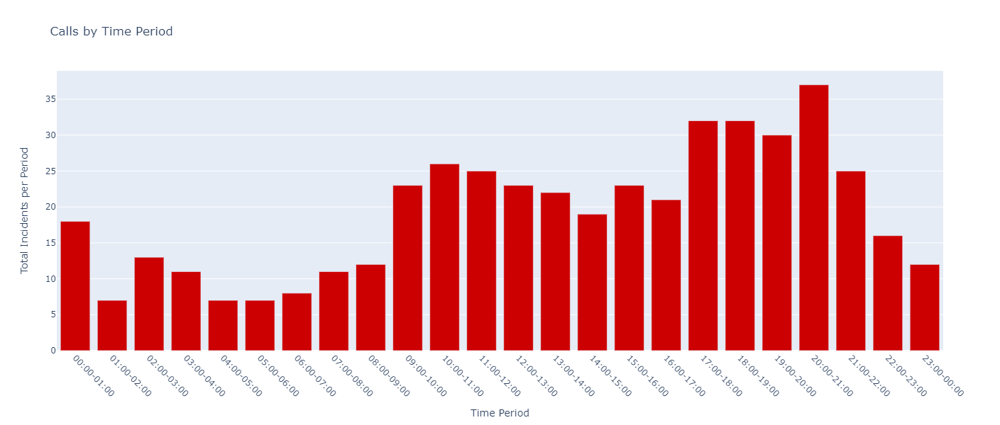

In [99]:
time_totals(unit_df(df,units[2]))

Being able to augment the graph so it is only showing specific time periods would be nice. But it would require further manipulation of the data from the dataframe.<br>
Perhaps, then, making a better function, or class even, would be a better way to acquire specific data for specific moments and events

#### Create a Dataframe Class
Create a new class function to better acquire specific information from the dataframe created earlier

In [100]:
class IncidentData():
    data = "~/Downloads/Programming/Response_Overview/past_year_incidents.csv"
    df = pd.read_csv(data,parse_dates=[0],index_col=0)
   
    # initiate the class and populate the dataframe with the following parameters
    def __init__(self,time1,time2,month,df=df):

        t_interval = ['--']
        t_interval.extend([f'0{x}:00:00' if x < 10 else f'{x}:00:00' for x in range(24)])
        self.df = df

        self.month = month
        # if only some times are selected or if times are equal, set the times apart so data can be captured
        if time1 not in t_interval[1:] and time2 not in t_interval[1:]:
            self.time1 = '00:00:00'
            self.time2 = '23:59:59'
        elif time1 not in t_interval[1:] and time2 in t_interval[1:]:
            if time2 == t_interval[1]:
                self.time1 = '23:59:59'
            else:
                self.time2 = time2
                self.time1 = t_interval[1]
        elif time1 in t_interval[1:] and time2 not in t_interval[1:]:
            if time1 == t_interval[1]:
                self.time1 = time1
                self.time2 = '23:59:59'
            else:
                self.time1 = time1
                self.time2 = '23:59:59'
        else:
            self.time1 = time1  
            self.time2 = time2
      
    # function for company level data        
    def company(self,company):
        month=self.month
        time1=self.time1
        time2=self.time2
               
        if month in range(1,13):
            # calls per company per times within the month
            month_df = self.df[(self.df['UNITS'].str.contains(company)) & \
            (self.df['UNITS'].isna() == False) & (self.df.index.month == month)].copy()
            if time1 > time2:
                company_df = month_df[(month_df['TIME']>=time1) | (month_df['TIME']<time2)].copy()
                return company_df
            else:
                company_df = month_df[(month_df['TIME']>=time1) & (month_df['TIME']<time2)].copy()
                return company_df
        else:
            comp_df = self.df[(self.df['UNITS'].str.contains(company)) & \
            (self.df['UNITS'].isna() == False)].copy()
            if time1 > time2:
                company_df = comp_df[(comp_df['TIME']>=time1) | (comp_df['TIME']<time2)].copy()
                return company_df
            else:
                company_df = comp_df[(comp_df['TIME']>=time1) & (comp_df['TIME']<time2)].copy()
                return company_df
                
    # function for overall department data                    
    def all(self):
        month=self.month
        time1=self.time1
        time2=self.time2
        
        # time period during a month
        if month in range(1,13):
            # calls for the whole department over a given month
            month_df = self.df[self.df.index.month==month].copy()
            # calls between time periods for the month
            if time1 > time2:
                all_df = month_df[(month_df.TIME>=time1) | (month_df.TIME<time2)].copy()
                return all_df
            else:
                all_df = month_df[(month_df.TIME>=time1) & (month_df.TIME<time2)].copy()
                return all_df
        # time period over overall
        else:
            # calls across the full time in dataframe
            if time1 > time2:
                all_df = self.df[(self.df.TIME>=time1) | (self.df.TIME<time2)].copy()
                return all_df
            else:
                all_df = self.df[(self.df.TIME>=time1) & (self.df.TIME<time2)].copy()
                return all_df

In [101]:
IncidentData('','','').all()

,UNITS,LOCATION,TYPE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
2024-03-26 04:25:00,NaN,42 GREENLAWN DR DANBURY CT,CHEST PAIN DELTA,04:25:00,2024-03-26,"42 GREENLAWN DR, DANBURY, CT",41.389216,-73.508559
2024-03-25 23:46:00,NaN,5 NABBY RD DANBURY CT,BREATHING PROBLEMS DELTA,23:46:00,2024-03-25,"5 NABBY RD, DANBURY, CT",41.439642,-73.415147
2024-03-25 21:52:00,NaN,37 APPLE RIDGE RD DANBURY CT,FALLS DELTA,21:52:00,2024-03-25,"37 APPLE RIDGE RD, DANBURY, CT",41.375880,-73.493646
2024-03-25 18:55:00,NaN,63 HOSPITAL AVE DANBURY CT,CARDIAC / RESP ARREST DELTA,18:55:00,2024-03-25,"63 HOSPITAL AVE, DANBURY, CT",41.407944,-73.441769
2024-03-25 18:49:00,NaN,104 MILL PLAIN RD DANBURY CT,FIRE ALARM - COMMERCIAL,18:49:00,2024-03-25,"104 MILL PLAIN RD, DANBURY, CT",41.393277,-73.517441
...,...,...,...,...,...,...,...,...
2023-04-25 13:59:00,TAC1,33 TOWN HILL AVE DANBURY CT,CHEST PAIN DELTA,13:59:00,2023-04-25,"33 TOWN HILL AVE, DANBURY, CT",41.389706,-73.443571
2023-04-25 13:52:00,E26,33 ABBEY LN DANBURY CT,SICK PERSON (SPECIFIC) BRAVO,13:52:00,2023-04-25,"33 ABBEY LN, DANBURY, CT",41.382131,-73.525821
2023-04-25 13:39:00,TAC1,25 MEMORIAL DR DANBURY CT,MEDICAL ALERT,13:39:00,2023-04-25,"25 MEMORIAL DR, DANBURY, CT",41.380964,-73.437790
2023-04-25 13:14:00,E24,28 CORN TASSLE RD DANBURY CT,FIRE ALARM - RESIDENTIAL,13:14:00,2023-04-25,"28 CORN TASSLE RD, DANBURY, CT",41.432998,-73.434101


In [102]:
IncidentData(times[3],times[10],'').company('E24')

,UNITS,LOCATION,TYPE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
2024-01-08 01:28:00,E24,W I84 HWY DANBURY CT,HAZ-MAT LEVEL 1,01:28:00,2024-01-08,"W I84 HWY, DANBURY, CT",0.000000,0.000000
2024-01-07 11:19:00,E24,67 NEWTOWN RD DANBURY CT,MVA W INJ DELTA,11:19:00,2024-01-07,"67 NEWTOWN RD, DANBURY, CT",41.406105,-73.415990
2024-01-05 14:57:00,E24,27 LOCUST AVE DANBURY CT,MVA W INJ DELTA,14:57:00,2024-01-05,"27 LOCUST AVE, DANBURY, CT",41.401753,-73.440675
2024-01-05 09:02:00,E24,7005 HANCOCK DR DANBURY CT,LOCK OUT,09:02:00,2024-01-05,"7005 HANCOCK DR, DANBURY, CT",41.432473,-73.421766
2024-01-04 21:28:00,E24,67 CEDAR DR DANBURY CT,FIRE ALARM - RESIDENTIAL,21:28:00,2024-01-04,"67 CEDAR DR, DANBURY, CT",41.448252,-73.431568
...,...,...,...,...,...,...,...,...
2023-04-26 06:34:00,E24,5 NABBY RD DANBURY CT,CARDIAC / RESP ARREST DELTA,06:34:00,2023-04-26,"5 NABBY RD, DANBURY, CT",41.439642,-73.415147
2023-04-25 22:22:00,E24,114 FEDERAL RD DANBURY CT,FALLS BRAVO,22:22:00,2023-04-25,"114 FEDERAL RD, DANBURY, CT",41.424280,-73.421786
2023-04-25 18:01:00,E24,2 GERMANTOWN RD DANBURY CT,FIRE ALARM - COMMERCIAL,18:01:00,2023-04-25,"2 GERMANTOWN RD, DANBURY, CT",41.409025,-73.436811
2023-04-25 17:12:00,E24,51 FEDERAL RD DANBURY CT,UNK PROBLEM / MAN DOWN DELTA,17:12:00,2023-04-25,"51 FEDERAL RD, DANBURY, CT",41.408941,-73.428630


## Statistical Information
At this point, there are good visualizations, and a quick way of accessing specific data from the dataframe. Now it is time to develop some bettr statistical information regarding the Department's incident responses.<br>
#### Location and Type
As seen above, there are multiple responses to the same location, and far greater responses to specific incident types compared to others. With the code developed so far it should be easier to drill into that data. Breaking down the responses to commoon locations, and the most common type of calls at given locations can provide additional insights and patterns of response. This information can be used for a variety of reasons: training, response augmentation, resource allocation, and to see if there are ways to lessen the burden on emergency services

In [103]:
IncidentData('','','').all()['TYPE'].value_counts()

FIRE ALARM - COMMERCIAL         858
BREATHING PROBLEMS DELTA        689
UNCONSCIOUS / FAINTING DELTA    561
UNK PROBLEM / MAN DOWN DELTA    529
MVA W INJ DELTA                 483
                               ... 
DOMESTIC DISTURBANCE              1
THREATENING-HARASSMENT            1
HEADACHE BRAVO                    1
TRAUMA (SPECIFIC) CHARLIE         1
FIRE- BRUSH FIRE 2                1
Name: TYPE, Length: 120, dtype: int64

In [104]:
IncidentData('','','').all()['LOCATION'].value_counts()

25 MEMORIAL DR DANBURY CT            118
7 BACKUS AVE DANBURY CT              106
66 WOOSTER HEIGHTS RD DANBURY CT      82
51 MAIN ST DANBURY CT                 80
36 W WOOSTER ST DANBURY CT            80
                                    ... 
31 OSBORNE ST DANBURY CT               1
40 CHAMBERS RD DANBURY CT              1
43 VIRGINIA AVE DANBURY CT             1
SOUTH ST/FAIRFIELD AVE DANBURY CT      1
28 CORN TASSLE RD DANBURY CT           1
Name: LOCATION, Length: 3484, dtype: int64

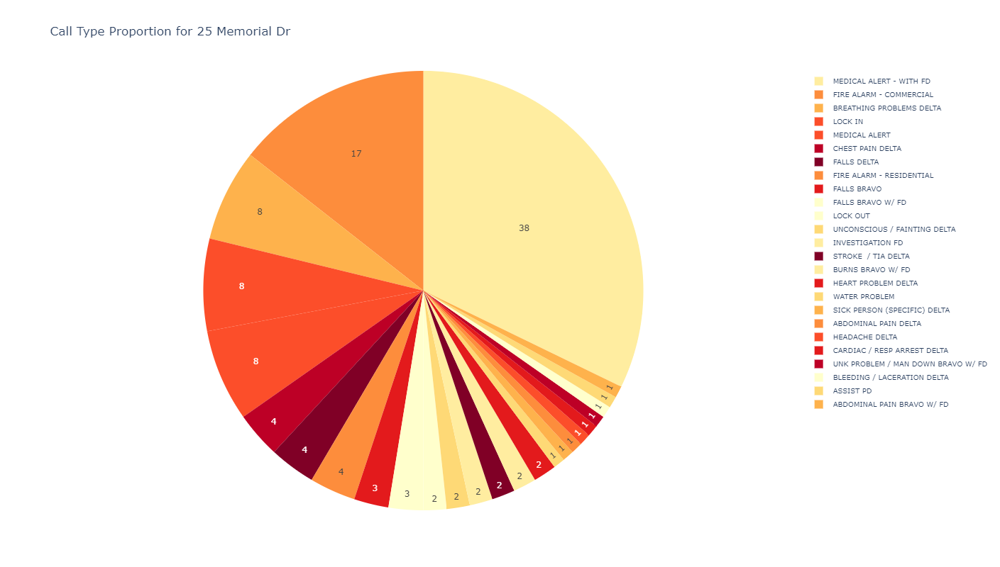

In [105]:
dff = IncidentData('','','').all()

memorialdrive = dff[dff['LOCATION'].str.contains('25 MEMORIAL DR DANBURY CT')]
pie = px.pie(memorialdrive,
             names='TYPE',
             color='TYPE',
             color_discrete_sequence=px.colors.sequential.YlOrRd,
             title='Call Type Proportion for 25 Memorial Dr',
             height=800,
             width=800)
pie.update_layout(legend_font=dict(size=10))
pie.update_traces(textinfo='value')

#### Locations with greater than 50 responses

In [137]:
dff.LOCATION.value_counts()[dff.LOCATION.value_counts()>14]

25 MEMORIAL DR DANBURY CT           118
7 BACKUS AVE DANBURY CT             106
66 WOOSTER HEIGHTS RD DANBURY CT     82
51 MAIN ST DANBURY CT                80
36 W WOOSTER ST DANBURY CT           80
                                   ... 
72 NEWTOWN RD DANBURY CT             15
17 HOYT ST DANBURY CT                15
4 DIVISION ST DANBURY CT             15
80 NEWTOWN RD DANBURY CT             15
10 HAYESTOWN RD DANBURY CT           15
Name: LOCATION, Length: 61, dtype: int64

#### The top 5 responded too locations

In [107]:
loc_gt50 = dff.LOCATION.value_counts()[dff.LOCATION.value_counts()>50]
loc_gt50.head()

25 MEMORIAL DR DANBURY CT           118
7 BACKUS AVE DANBURY CT             106
66 WOOSTER HEIGHTS RD DANBURY CT     82
51 MAIN ST DANBURY CT                80
36 W WOOSTER ST DANBURY CT           80
Name: LOCATION, dtype: int64

#### The top 10 response types

In [108]:
type_top10 = dff.TYPE.value_counts()[dff.TYPE.value_counts()>100]
type_top10.head(10)

FIRE ALARM - COMMERCIAL         858
BREATHING PROBLEMS DELTA        689
UNCONSCIOUS / FAINTING DELTA    561
UNK PROBLEM / MAN DOWN DELTA    529
MVA W INJ DELTA                 483
CHEST PAIN DELTA                399
LOCK OUT                        233
INVESTIGATION FD                217
CONVULSIONS / SEIZURES DELTA    193
HEART PROBLEM DELTA             191
Name: TYPE, dtype: int64

#### Top Locations by type and vice versa

In [109]:
dff.LOCATION[dff.TYPE.isin(type_top10.index)].value_counts().head()

25 MEMORIAL DR DANBURY CT           101
7 BACKUS AVE DANBURY CT              83
66 WOOSTER HEIGHTS RD DANBURY CT     75
33.5 PEMBROKE RD DANBURY CT          71
36 W WOOSTER ST DANBURY CT           69
Name: LOCATION, dtype: int64

In [110]:
dff.TYPE[dff.LOCATION.isin(loc_gt50.index)].value_counts().head()

BREATHING PROBLEMS DELTA    118
FIRE ALARM - COMMERCIAL      88
MVA W INJ DELTA              87
MEDICAL ALERT - WITH FD      81
CHEST PAIN DELTA             72
Name: TYPE, dtype: int64

In [111]:
loc_gt50.index[0]

'25 MEMORIAL DR DANBURY CT'

In [186]:
def pie_type(i): 
    df_pie2 = IncidentData('','','').all()
    types = df_pie2['TYPE'].value_counts().head(50)
    type_loc = df_pie2[df_pie2['TYPE'].str.contains(types.index[i])]
    # those locations response types
    type_pie = px.pie(type_loc,
                 names='LOCATION',
                 color='LOCATION',
                 color_discrete_sequence=px.colors.sequential.YlOrRd,
                 title=f'Number of Responses to Location for {types.index[i]}',
                 height=600,
                 width=800)
    type_pie.update_traces(textinfo='value')
    type_pie.update_layout(legend_font=dict(size=10),
                          legend_y=.5,
                          font={'color':'rgb(255,255,255)'},
                          paper_bgcolor='#0f2537')
    
    return type_pie

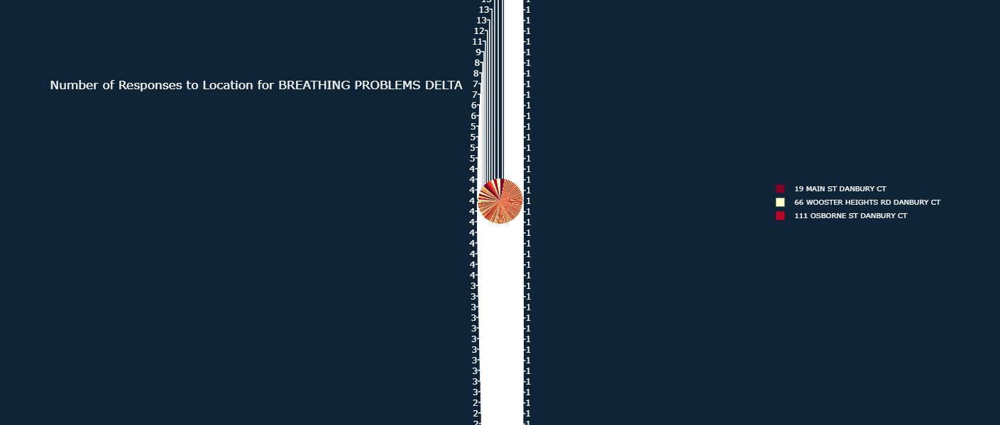

In [187]:
pie_type(1)

In [114]:
dff.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8090 entries, 2024-03-26 04:25:00 to 2023-04-25 12:43:00
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   UNITS      6254 non-null   object 
 1   LOCATION   8090 non-null   object 
 2   TYPE       8090 non-null   object 
 3   TIME       8090 non-null   object 
 4   DATE       8090 non-null   object 
 5   ADDRESS    8090 non-null   object 
 6   LATITUDE   8090 non-null   float64
 7   LONGITUDE  8090 non-null   float64
dtypes: float64(2), object(6)
memory usage: 568.8+ KB


#### Add a Function to IncidentData
Add the units_df from up above to the IncidentData class as an additional function

In [115]:
class IncidentData():
    data = "~/Downloads/Programming/Response_Overview/past_year_incidents.csv"
    df = pd.read_csv(data,parse_dates=[0],index_col=0)
   
    # initiate the class and populate the dataframe with the following parameters
    def __init__(self,time1,time2,month,df=df):

        t_interval = ['--']
        t_interval.extend([f'0{x}:00:00' if x < 10 else f'{x}:00:00' for x in range(24)])
        self.df = df

        self.month = month
        # if only some times are selected or if times are equal, set the times apart so data can be captured
        if time1 not in t_interval[1:] and time2 not in t_interval[1:]:
            self.time1 = '00:00:00'
            self.time2 = '23:59:59'
        elif time1 not in t_interval[1:] and time2 in t_interval[1:]:
            if time2 == t_interval[1]:
                self.time1 = '23:59:59'
            else:
                self.time2 = time2
                self.time1 = t_interval[1]
        elif time1 in t_interval[1:] and time2 not in t_interval[1:]:
            if time1 == t_interval[1]:
                self.time1 = time1
                self.time2 = '23:59:59'
            else:
                self.time1 = time1
                self.time2 = '23:59:59'
        else:
            self.time1 = time1  
            self.time2 = time2
      
    # function for company level data        
    def company(self,company):
        month=self.month
        time1=self.time1
        time2=self.time2
               
        if month in range(1,13):
            # calls per company per times within the month
            month_df = self.df[(self.df['UNITS'].str.contains(company)) & \
            (self.df['UNITS'].isna() == False) & (self.df.index.month == month)].copy()
            if time1 > time2:
                company_df = month_df[(month_df['TIME']>=time1) | (month_df['TIME']<time2)].copy()
                return company_df
            else:
                company_df = month_df[(month_df['TIME']>=time1) & (month_df['TIME']<time2)].copy()
                return company_df
        else:
            comp_df = self.df[(self.df['UNITS'].str.contains(company)) & \
            (self.df['UNITS'].isna() == False)].copy()
            if time1 > time2:
                company_df = comp_df[(comp_df['TIME']>=time1) | (comp_df['TIME']<time2)].copy()
                return company_df
            else:
                company_df = comp_df[(comp_df['TIME']>=time1) & (comp_df['TIME']<time2)].copy()
                return company_df
                
    # function for overall department data                    
    def all(self):
        month=self.month
        time1=self.time1
        time2=self.time2
        
        # time period during a month
        if month in range(1,13):
            # calls for the whole department over a given month
            month_df = self.df[self.df.index.month==month].copy()
            # calls between time periods for the month
            if time1 > time2:
                all_df = month_df[(month_df.TIME>=time1) | (month_df.TIME<time2)].copy()
                return all_df
            else:
                all_df = month_df[(month_df.TIME>=time1) & (month_df.TIME<time2)].copy()
                return all_df
        # time period over overall
        else:
            # calls across the full time in dataframe
            if time1 > time2:
                all_df = self.df[(self.df.TIME>=time1) | (self.df.TIME<time2)].copy()
                return all_df
            else:
                all_df = self.df[(self.df.TIME>=time1) & (self.df.TIME<time2)].copy()
                return all_df
                
    def unit_df(self):
        df=self.df
        type = df.TYPE.unique().tolist()
        all_units = ['C30','T1','TAC1','SQ21','E22','E23','E24','E25','E26']
        
        # create an array of appropriate size
        array = np.zeros([len(type),len(all_units)],dtype=int)
        
        #create the dataframe
        units_df = pd.DataFrame(array,index=type,columns=all_units)
        
        for c in all_units:
            unit = df[(df.UNITS.str.contains(c)) & (df.UNITS.isna()==False)].TYPE.value_counts()
            for i in range(len(units_df)):
                if units_df.index[i] in unit.index:
                    units_df[c].loc[units_df.index[i]] = unit[units_df.index[i]]
        return units_df

In [116]:
IncidentData('','','').unit_df().head(10)

,C30,T1,TAC1,SQ21,E22,E23,E24,E25,E26
CHEST PAIN DELTA,2,1,82,32,34,37,29,31,36
BREATHING PROBLEMS DELTA,1,0,124,75,56,107,52,31,56
FALLS DELTA,0,0,14,17,13,14,10,11,10
CARDIAC / RESP ARREST DELTA,5,1,48,9,8,17,14,3,8
FIRE ALARM - COMMERCIAL,193,202,3,18,192,149,66,17,97
ALLERGIES DELTA,0,0,4,3,9,8,5,1,2
WIRES DOWN- ELECTRICAL,1,2,1,3,48,11,12,11,12
DIABETIC PROBLEMS DELTA,0,0,10,4,8,11,4,0,5
FALLS BRAVO,4,1,10,7,4,16,11,5,6
FIRE-1ST ALARM,12,22,6,10,11,14,2,6,11


In [117]:
units_df = IncidentData('','','').unit_df()
units_df['C30'].sum()

399

In [118]:
totals = pd.Series([units_df[x].sum() for x in units_df.columns],index=units_df.columns)
totals

C30      399
T1       460
TAC1    1096
SQ21     695
E22     1092
E23     1066
E24      661
E25      390
E26      747
dtype: int64

In [119]:
totals.sum()

6606

In [120]:
dff[dff.index.month==2]

,UNITS,LOCATION,TYPE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
2024-02-29 23:01:00,NaN,MAIN ST/DOWNS ST DANBURY CT,CHEST PAIN DELTA,23:01:00,2024-02-29,"MAIN ST/DOWNS ST, DANBURY, CT",0.000000,0.000000
2024-02-29 22:12:00,NaN,12 MOUNTAINVIEW TER DANBURY CT,STROKE / TIA DELTA,22:12:00,2024-02-29,"12 MOUNTAINVIEW TER, DANBURY, CT",41.416406,-73.410608
2024-02-29 22:02:00,NaN,W I84 HWY DANBURY CT,INVESTIGATION FD,22:02:00,2024-02-29,"W I84 HWY, DANBURY, CT",0.000000,0.000000
2024-02-29 19:22:00,NaN,36 BELMONT CIR DANBURY CT,BREATHING PROBLEMS DELTA,19:22:00,2024-02-29,"36 BELMONT CIR, DANBURY, CT",41.382452,-73.469878
2024-02-29 17:14:00,NaN,94 LOCUST AVE DANBURY CT,FIRE ALARM - COMMERCIAL,17:14:00,2024-02-29,"94 LOCUST AVE, DANBURY, CT",41.404428,-73.447189
...,...,...,...,...,...,...,...,...
2024-02-01 09:08:00,NaN,22 ABBEY LN DANBURY CT,STROKE / TIA DELTA,09:08:00,2024-02-01,"22 ABBEY LN, DANBURY, CT",41.382032,-73.524978
2024-02-01 08:35:00,NaN,15 EDGEWATER CIR DANBURY CT,BREATHING PROBLEMS DELTA,08:35:00,2024-02-01,"15 EDGEWATER CIR, DANBURY, CT",41.402265,-73.426896
2024-02-01 07:32:00,NaN,7 PONDVIEW TER DANBURY CT,MEDICAL ALERT - WITH FD,07:32:00,2024-02-01,"7 PONDVIEW TER, DANBURY, CT",41.388637,-73.506302
2024-02-01 03:17:00,NaN,33.5 PEMBROKE RD DANBURY CT,CHEST PAIN DELTA,03:17:00,2024-02-01,"33.5 PEMBROKE RD, DANBURY, CT",41.476494,-73.497704


In [161]:
dff1 = IncidentData('','','').all()  
dff1['LOCATION'] = dff1.LOCATION.apply([lambda x: x[:-11]]) 
dff1

,UNITS,LOCATION,TYPE,TIME,DATE,ADDRESS,LATITUDE,LONGITUDE
2024-03-26 04:25:00,NaN,42 GREENLAWN DR,CHEST PAIN DELTA,04:25:00,2024-03-26,"42 GREENLAWN DR, DANBURY, CT",41.389216,-73.508559
2024-03-25 23:46:00,NaN,5 NABBY RD,BREATHING PROBLEMS DELTA,23:46:00,2024-03-25,"5 NABBY RD, DANBURY, CT",41.439642,-73.415147
2024-03-25 21:52:00,NaN,37 APPLE RIDGE RD,FALLS DELTA,21:52:00,2024-03-25,"37 APPLE RIDGE RD, DANBURY, CT",41.375880,-73.493646
2024-03-25 18:55:00,NaN,63 HOSPITAL AVE,CARDIAC / RESP ARREST DELTA,18:55:00,2024-03-25,"63 HOSPITAL AVE, DANBURY, CT",41.407944,-73.441769
2024-03-25 18:49:00,NaN,104 MILL PLAIN RD,FIRE ALARM - COMMERCIAL,18:49:00,2024-03-25,"104 MILL PLAIN RD, DANBURY, CT",41.393277,-73.517441
...,...,...,...,...,...,...,...,...
2023-04-25 13:59:00,TAC1,33 TOWN HILL AVE,CHEST PAIN DELTA,13:59:00,2023-04-25,"33 TOWN HILL AVE, DANBURY, CT",41.389706,-73.443571
2023-04-25 13:52:00,E26,33 ABBEY LN,SICK PERSON (SPECIFIC) BRAVO,13:52:00,2023-04-25,"33 ABBEY LN, DANBURY, CT",41.382131,-73.525821
2023-04-25 13:39:00,TAC1,25 MEMORIAL DR,MEDICAL ALERT,13:39:00,2023-04-25,"25 MEMORIAL DR, DANBURY, CT",41.380964,-73.437790
2023-04-25 13:14:00,E24,28 CORN TASSLE RD,FIRE ALARM - RESIDENTIAL,13:14:00,2023-04-25,"28 CORN TASSLE RD, DANBURY, CT",41.432998,-73.434101


In [162]:
loc_count = dff1.iloc[:,1].value_counts()[dff1.iloc[:,1].value_counts()>14]
loc_count.index.name = 'Location'
loc_count_dict = {k:v for k,v in zip(loc_count.index,range(len(loc_count.index)))}

In [165]:
loc_count_dict[loc_count.index[1]]

1